# Mod 4 Final Project

* Student name: Jeff Spagnola
* Student pace: Full Time 
* Scheduled project review date/time: 
* Instructor name: James Irving
* Blog post URL:

<center> <img src="dark-twitter-birdjpg.jpg" alt="Twitter Disaster" width = "700" height = "300"> </center>

## Introduction

The ability to develop a system that can accurately determine the context of a tweet can be useful in many areas, especially for organizations in the news and security sectors.  Social media outlets are increasingly becoming the primary place where news "breaks" and the ability to sift through the noise and find posts about catastropic events can lead to a much quicker response and a better concept of the details surrounding the situation. 

Within this notebook, we will create a model that can act as a social media monitor that will take in a series of tweets and determine whether or not a tweet is in reference to an actual disaster.  For example, we can use natural langauge processing to determine the difference between "There is a brush fire in Australia." and "The new Kenrick Lamar song is fire!"

### Import Packages

In [1]:
# Import numpy & tensorflow
import numpy as np
import tensorflow as tf

# Random Seed
np.random.seed(30)
tf.random.set_seed(30)

In [2]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /Users/spags/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [3]:
# The usual packages
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import string
import re

# Sklearn Stuff
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import classification_report, plot_confusion_matrix, plot_roc_curve, confusion_matrix
from sklearn.metrics import recall_score

# NLP stuff
import nltk
from nltk.corpus import stopwords
from nltk import FreqDist
from nltk import word_tokenize
from gensim.models import Word2Vec
from nltk.tokenize.casual import TweetTokenizer
from nltk.collocations import BigramAssocMeasures, BigramCollocationFinder


# Keras Stuff
from tensorflow import keras
from keras.preprocessing.text import Tokenizer
from keras.preprocessing import text, sequence
from keras.utils import to_categorical
from tensorflow.keras.layers import Dense, LSTM, Embedding, SpatialDropout1D, Dropout
from tensorflow.keras.layers import Bidirectional, LeakyReLU
from tensorflow.keras.models import Sequential
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping


Bad key "text.kerning_factor" on line 4 in
/Users/spags/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/matplotlib/mpl-data/stylelib/_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.3/matplotlibrc.template
or from the matplotlib source distribution


### Functions

In [4]:
# Dataframe Info

def import_csv(csv):
    """I don't know why I made this, but it takes in the csv file name and returns a dataframe."""
    df = pd.read_csv(csv)
    return df

def get_df_info(df):
    '''Simple function that takes in a dataframe and returns some basic info.'''
    print(df.shape)
    print(df.info())
    print(df.isna().sum())
    
def get_columns_with_nulls(df):
    '''Iterates through a dataframe and pulls out the columns with null values, 
    as well as the amount of null values in the column.'''
    
    print("Columns with Null Values")
    print("-------------------------")
    for column in df.columns:
        if df[column].isna().sum() > 0:
            print(column, ' = ', df[column].isna().sum())
            
# Plotting
            
def count_plot(df, column):
    '''Plots a countplot after taking in a dataframe and column.'''
    
    # Setting style for plots
    sns.set_style('darkgrid')
    sns.set(font_scale = 1.25)

    # Plotting barplot
    ax = plt.figure(figsize = (12, 6))
    ax = sns.countplot(data = df, x = column)
    ax.set_title('Number of Attacks by {}'.format(column.split('_')[0].title()))
    ax.set_xlabel(column.split('_')[0].title())
    ax.set_ylabel('Count')
    plt.xticks(rotation = 90);
    
def barplot(data, x, y, title, xlabel, ylabel):
    ''' Plots a simple, customized seaborn barplot'''
    
    plt.figure(figsize = (18, 8))
    sns.barplot(data = data, x = x, y = y)
    plt.title(title, fontsize = 20)
    plt.xlabel(xlabel, fontsize = 16)
    plt.ylabel(ylabel, fontsize = 16)
    plt.xticks(rotation = 45, fontsize = 12, ha = 'right') 
    plt.show();

# Evaluating Models

def evaluate_classifier(model, X_test, y_test):
    '''Evaluates a classification model by displaying a classification report, 
    a confusion matrix plot, and a ROC-AUC plot.'''
    
    # Predictions
    y_hat_test = model.predict(X_test)
      
    # Classification Report
    print('                 Classification Report')
    print('-------------------------------------------------------')
    print(classification_report(y_test, y_hat_test))
    
    # Confusion Matrix Plot
    labels = ['Disaster', 'Non-Disaster']
    fig, axes = plt.subplots(figsize = (12, 6), ncols = 2)
    plot_confusion_matrix(model, X_test, y_test, normalize = 'true', cmap = 'Blues',
                          ax = axes[0])#, labels = labels)
    axes[0].set_title('Confusion Matrix');
    
    # ROC-AUC Curve
    roc__auc_plot = plot_roc_curve(model, X_test, y_test,ax=axes[1])
    axes[1].legend()
    axes[1].plot([0,1],[0,1],ls=':')
    axes[1].grid()
    axes[1].set_title('ROC-AUC Plot') 
    fig.tight_layout()
    plt.show()
    
def network_eval_plots(results):
    '''Visualizes the loss and accuracy of the training set and validation set'''
    
    history = results.history
    plt.figure()
    plt.plot(history['val_loss'])
    plt.plot(history['loss'])
    plt.legend(['val_loss', 'loss'])
    plt.title('Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.show()
    
    plt.figure()
    plt.plot(history['val_acc'])
    plt.plot(history['acc'])
    plt.legend(['val_acc', 'acc'])
    plt.title('Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.show()
    
def nn_confusion_matrix(y_test, preds):
    '''Creates a confusion matrix specifically for neural networks.'''
    labels = ['Disaster', 'Normal']
    cm = confusion_matrix(y_test, preds, normalize = 'true')
    ax = plt.figure(figsize = (6,6))
    ax = sns.heatmap(cm, cmap = 'Blues', annot = True, 
                     xticklabels = ['Disaster', 'Normal'], yticklabels = ['Disaster', 'Normal'])
    ax.set_ylim([0,2])

def evaluate_network(results, model, X_test, y_test):
    preds = model.predict(X_test).round()
    print('                 Model Evaluation')
    print('-------------------------------------------------------')
    print(model.evaluate(X_test, y_test))
    print(' ')
    print('                 Loss & Accuracy Curves')
    print('-------------------------------------------------------')
    network_eval_plots(results)
    print(' ')
    print('                 Classification Report')
    print('-------------------------------------------------------')
    print(classification_report(y_test, preds))
    print(' ')    
    print('                 Confusion Matrix')
    print('-------------------------------------------------------')
    nn_confusion_matrix(y_test, preds)
    
# Cleaning Text

def remove_url(text):
    '''Takes in block of text and returns it without url'''
    url = re.compile(r"https?://\S+|www\.\S+")
    return url.sub(r"", text)

def remove_html(text):
    '''Takes in a block of text and removes any html'''
    html = re.compile(r"<.*?>")
    return html.sub(r"", text)
    
def remove_emoji(string):
    '''Takes in a string and removes any emojis or other symbols'''
    emoji_pattern = re.compile(pattern = 
        "["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
        "]+",
        flags = re.UNICODE
    )
    return emoji_pattern.sub(r"", string)

def remove_punctuation(text):
    ''' Removes punctuation'''
    table = str.maketrans("", "", string.punctuation)
    return text.translate(table)

def remove_stopwords(text):
    stop = set(stopwords.words('english'))
    text = [word.lower() for word in text.split() if word.lower() not in stop]
    
    return " ".join(text)

def get_recall(model, X_test, y_test):
    '''Prints the recall score for a model.'''
    
    # Predictions
    y_hat_test = model.predict(X_test)
    
    # Get Recall Sore
    recall = recall_score(y_test, y_hat_test)
    return recall

## Obtain

 <div class="alert alert-info" role="alert">
The data was obtained from the <a href="https://www.kaggle.com/vstepanenko/disaster-tweets">Disaster Tweets dataset on Kaggle</a>.  The dataset contains over 11,000 tweets associated with disaster keywords such as "crash", "quarantine", "ablaze", and others.  All tweets were collected on Jan. 14th, 2020 and some of the topics collected were the eruption of Taal Volcano in Batangas, Phillippines, Coronavirus, Bushfires in Australia, and the downing of flight PS752.  
    </div>

### Import Data

In [5]:
# Importing the dataset

df = pd.read_csv('tweets.csv')
print(df.shape)
df.head()

(11370, 5)


,id,keyword,location,text,target
0,0,ablaze,NaN,"Communal violence in Bhainsa, Telangana. ""Ston...",1
1,1,ablaze,NaN,Telangana: Section 144 has been imposed in Bha...,1
2,2,ablaze,New York City,Arsonist sets cars ablaze at dealership https:...,1
3,3,ablaze,"Morgantown, WV",Arsonist sets cars ablaze at dealership https:...,1
4,4,ablaze,NaN,"""Lord Jesus, your love brings freedom and pard...",0


> Target = 1 for actual disaster, 0 for non-disaster. 

In [6]:
# Getting basic info on the dataframe

get_df_info(df)

(11370, 5)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11370 entries, 0 to 11369
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   id        11370 non-null  int64 
 1   keyword   11370 non-null  object
 2   location  7952 non-null   object
 3   text      11370 non-null  object
 4   target    11370 non-null  int64 
dtypes: int64(2), object(3)
memory usage: 444.3+ KB
None
id             0
keyword        0
location    3418
text           0
target         0
dtype: int64


In [7]:
# ID column is unneceassry so we can drop it

df.drop('id', axis = 1, inplace = True)
print(df.shape)
df.head()

(11370, 4)


,keyword,location,text,target
0,ablaze,NaN,"Communal violence in Bhainsa, Telangana. ""Ston...",1
1,ablaze,NaN,Telangana: Section 144 has been imposed in Bha...,1
2,ablaze,New York City,Arsonist sets cars ablaze at dealership https:...,1
3,ablaze,"Morgantown, WV",Arsonist sets cars ablaze at dealership https:...,1
4,ablaze,NaN,"""Lord Jesus, your love brings freedom and pard...",0


 <div class="alert alert-info" role="alert">
Full dataset is 4 columns and 11,370 rows.  Lots of null values within the location column and the text column is super messy.  
    </div>

## Scrub

### Explore the Data

In [8]:
# Refresh our memory on the amount of null values and the unique values

print('The Number of Nulls in this column:', df['location'].isna().sum())
print('The Unique Value Counts in this column:', df['location'].value_counts().unique().sum())

The Number of Nulls in this column: 3418
The Unique Value Counts in this column: 1227


In [9]:
# Get value counts for location column 

df['location'].value_counts()

United States       96
Australia           83
London, England     81
UK                  77
India               74
                    ..
Valhala, Rising      1
Myoi’s               1
Bedfordshire, UK     1
Great Britain        1
Coney Island NY      1
Name: location, Length: 4504, dtype: int64

In [10]:
# Let's see what all the values are

for i in df['location']:
    print(i)

nan
nan
New York City
Morgantown, WV
nan
OC
London, England
Bharat
Accra, Ghana
Searching
nan
nan
nan
HYDERABAD
Reno, NV
nan
nan
nan
Worldwide
nan
nan
nan
Italy
` ˗ˏˋ i'm⠀waiting⠀for⠀you⠀to⠀pour⠀my⠀𝘀𝗶𝗻𝘀⠀onto⠀me⠀;⠀call⠀me⠀your⠀𝘭𝘰𝘷𝘦𝘳⠀whispering⠀hymns⠀to⠀my⠀ear⠀,⠀crucify⠀me⠀in⠀claims⠀of⠀praising⠀me .
Okielahoma
nan
nan
Havana 3am
nan
nan
nan
Washington, DC
India
Salta, Argentina
Wherever socks go in the dryer
Kuala Lumpur
nan
Sydney, New South Wales
Nigeria
Davanagere, India 
Lyndhurst, OH
Covina, Ca
Colorado, Brighton
nan
North Carolina, USA
kurger bing
Faridabad, India
60
ngovhela Mahunguni
nan
Germany
South Beach, FL
London, United Kingdom
Phoenix, AZ 85017
England, UK 
Melbourne, Australia
Pearland, TX
Africa
California, USA
nan
Kerala, India
Staffordshire,England
nan
Port Harcourt, Nigeria
nan
Everywhere
Ann Arbor, MI
Global
Puerto Rico, USA
In the mind of haters.
Czech Republic
USA
nan
Bay Area, CA
Great Southwest, U.S.A.
Katowice, Poland
nan
Toronto
Texas
são paulo -sp
  Philippine

Dun Laoghaire
ÜT: 45.290968,-92.376844
United States
Milano, Lombardia
United States
Toronto, Canada
Concord
Morally Grey opinion & thought
nan
nan
nan
Oregon, Australia and Hawaii
nan
MX-TX-TN-CA-MI-IN-GA
Grodno, Belarus
Cornwall
nan
Des Moines
USA
ateneo
nan
Maldives
Maldives
Maldives
Zhanjiang, Guangdong, China
Washington,DC
nan
Maldives
Sweden
nan
Troy, NY
nan
Cafe Le Blanc, Yongenjaya
OCALA, FL
nan
nan
Mildly Urgent Department
Bangfield
UK
somewhere dancing
nan
www.facebook.com/libertyzabala
New York, USA
ʟᴏʏᴀʟ 𝐏𝐀𝐑𝐓𝐍𝐄𝐑 𝑜𝑓 ᴍᴀᴅᴇɪɴʜxᴀᴠᴇɴ, 𝐒𝐎𝐀 𝐀𝐆𝐄𝐍𝐓 𝑜𝑓 ᴛʜᴇ 𝐁.𝐒.𝐀.𝐀| 𝐑𝐄𝐒𝐈𝐃𝐄𝐍𝐓 𝐄𝐕𝐈𝐋 + 𝑀𝑈𝐿𝑇𝐼, { 𝒂𝒅𝒐𝒓𝒆𝒅 𝑏𝑦 𝐑𝐔𝐊𝐈 }
United States
Pacific Northwest
under your bed
New Delhi, India
1 meter to Nirvana..
Australia
Louisiana, USA
South West, England
Music is life 🎵💜🕺
King’s Lynn, The EU 🇪🇺
King’s Lynn, The EU 🇪🇺
liverpool uk
Kampala, Uganda
South Africa
Nairobi, kenya
Nairobi, Kenya
nan
King’s Lynn, The EU 🇪🇺
socialmedia@haag-streit-uk.com
nan
Harlow, Essex
Louisiana, USA
Hong Kong
Nairobi, Kenya
Sur

nan
Hong Kong
California, USA
nan
Terranora, Australia
Fresno, CA
Hamilton, Scotland
Los Angeles
nan
nan
nan
nan
nan
The Internet
Orange, California
nan
nan
Virginia
Uganda, Nigeria
India
nan
Pawnee Nation
nan
nan
California, USA
nan
nan
nan
种花家
nan
Louisiana, USA
nan
England
St. Helens, England
Occupied Palestine #ترشيحا
Belfast, Northern Ireland
Liverpool
nan
nan
Zimbabwe, Midlands
colonized Lenape land (nyc)
nan
nan
nan
nan
One It Forever 🦋
Meanwhile, Scotland
Essendon, Melbourne, Australia
nan
nan
France
miami
nan
nan
Blagnac, France
倭国のド田舎  むぎわら一見とくまモンが居る所
nan
Earth
Around the world
nan
Limousin Area, France
Ngarabal land, Australia
nan
nan
nan
nan
nan
Belgrade
nan
nan
nan
Australia
nan
nan
UK
Proud Northumbrian.
honeymoon avé.
Some glacier called Maine
Bangkok, Thailand
Bigfoots Bluff
nan
Dallas, TX
Baltimore, MD
Australia
Afghanistan
nan
United States of Africa
nan
abuja
nan
Los Angeles, CA
Jakarta, Indonesia
Houston, TX
Belfast, North of Ireland 
nan
Muzaffarnagar, Uttar Prades

London, UK
London
Leicester, England
nan
nan
In the mountains ⛰
nan
Haarlem, Nederland
nan
edmonton, alberta, canada
Bailiwick of Jersey
United Arab Emirates
Taal, Calabarzon
Graz Österreich
Sydney
London, England
South Africa
4 Frazer Court, York, YO30 5FH
Sverige
Texas, USA
East Kilbride,Scotland
World overpopulated
Wales, United Kingdom
nan
azanian coolie
Bristol
Melbourne(-ish)
Nederland
Mexico
England, United Kingdom
nan
Chile
भारत
nan
South Africa
Everywhere
Swansea, Wales
Knutsford
WWW
Molong, New South Wales
Everywhere
Edinburgh
United Kingdom
Kokkola/Suomi, Karleby/Finland
🇲🇼|🇿🇦
nan
Worldwide
England, United Kingdom
Palma de Mallorca
South West, England
Calbayog City, Eastern Visayas
Minas Tirith
nan
nan
nan
United Kingdom
Canada, UK and Russia
West Covina
West Midlands, England
nan
Brisbane, Queensland
Thailand
Bucharest, Romania
nan
Manchester, England
Manila, Philippines
Amsterdam, Nederland
Country Australian
Fort Worth, TX
nan
nan
กรุงเทพมหานคร, ประเทศไทย
nan
Clown World


くるくる椅子
Clown World
BREAKTHROUGH HydroMolecularMed
Hyderabad, India
Köln, Deutschland
Perth W.A.
Republic of Serbia
Kenya
nan
Huntsville  Alabama
nan
Mysore, India
Dubai UAE
England
nan
London, England, UK
Perthshire
KM. 3, McArthur Highway, Matina, Davao City
Eugene,OR. USA
Mars if Trump is elected in 20
East Anglia, England, Europe.
📩 : (marshmallow-qa.com/kamo_pasta)
nan
Los Angeles
Gotham City
nan
U
The edge of reality
भारत 🇮🇳
Bengaluru, India
nan
Slovenija
seabed, eating mojos
nan
Adelaide, SA, Australia
South Africa
nan
England, United Kingdom
Hawaii, USA
nan
nan
Texas, USA. Fort Worth. 
United Kingdom
Cyprus
Stellenbosch, South Africa
DELHI, KASHMIR
New York, USA
London, England
Auld Reekie, Scotland
West Yorkshire,U.K
USA 🇺🇸
nan
Pakistan
Funkytown
nan
Puglia, Italia
nan
Wilmington, DE
nan
drew followed | 13.06.2014
nan
nan
Northern Ireland, United Kingd
India
nan
nan
Canberra
NEW YORK
Los Angeles, CA
भारत
nan
nan
NYC
nan
nan
Águilas-Murcia.
Selangor, Malaysia
nan
nan
California,

nan
metz | Sarah♡
West Village, Manhattan
nan
Canada
Brisbane, Queensland
PH
nan
nan
Gannungagap, Denmark
nan
nan
United States
Florida
nan
nan
Cinderford, England
Colchester, England
Polokwane in Seshego township
Petaling Jaya, Selangor
London
nan
nan
Australia
Malaysia
Punta del Este, Uruguay
home
nan
Jakarta
Kilmarnock, Scotland
nan
nan
nan
Scotland, but like at the top
Pakistan
South Carolina, USA
Island of the Gods & all too much plastic
Dublin City, Ireland
Mumbai
nan
Ërebor
Brisbane, Australia
Århus, Danmark now jojo heaven
nan
INDIA. (Bharat)
nan
Australia
Las Vegas, NV
nan
Houston, TX
Las Vegas, NV
San Antonio, TX
nan
nan
Oregon, USA
Selma, AL
nan
one - it (s)
Earth
Central Point, OR
nan
nan
Cheshire. UK
Paris, France
nan
NASHIK
nan
Western Australia
nan
Antequera, Málaga, Spain
nan
Montgomeryville, PA
Antequera, Málaga, Spain
nan
Hyderabad, Telangana, India
nan
nan
Hogwarts
Corpus Christi, Texas, US
Bradford
nan
München, Bayern
West Village, Manhattan
nan
India भारत-भूमि
Eart

an inexplicable though
watch sylvain and marianne supports
nan
𝚙𝚋&𝚓 𝚑𝚘𝚎𝚜
Brandon, Manitoba
TX
Morioh
nan
United Kingdom
nan
Right behind you
nan
nan
West coast True north  i stan juggalos
your local 7-11 parking lot
Chicago, IL
nan
nan
Pennsylvania, USA
Pennsylvania, USA
Pennsylvania, USA
nan
nan
Pennsylvania, USA
nan
Pennsylvania, USA
london
Pennsylvania, USA
nan
Detroit, MI
nan
18+
nan
#ℌᴇᴀᴛʜᴇʀ
01/27/14 - 08/07/18. 💗🐶
01/27/14 - 08/07/18. 💗🐶
nan
England, Great Britain
Paris
bg: firewatch | icon: me
nan
nan
Route 30
Coronado, CA
nan
North Carolina, USA
Texas, USA
nan
Ikeja Lagos Nigeria 😋
Branchburg, NJ 08876
Branchburg, NJ
t(he)y 17
FL
nan
nan
Watching you at a coffee shop
UK
nan
nan
Dubai 💓
bewear island
in the death basket
Paris, France
nan
Canada
Bexley, London
andhra pradesh,india
nan
nan
The Bad Place
nan
Mumbai
Tacoma
Bengaluru, India
at-large in India
Tacoma
Accra, Ghana
Scotland
nan
Johannesburg, South Africa
Kerala, India
nan
UK
nan
Basse-Normandie, France
nan
UK
Nottingham,

Ruiru, Kenya
nan
Pimlico/ London
Pretoria, South Africa
shorturl.at/dvwS7
nan
Net daar
nan
Florida
Bronx, NY
Sunny California
nan
USA
nan
Box Elder, SD
New York, USA
Dar es Salaam, Tanzania
Los Angeles, CA
Portland, OR
Melbourne, Victoria
Box Elder, SD
Kigali, Rwanda
Ireland, United Kingdom
California, USA
She/Her
London
nan
nan
England, United Kingdom
On a journey
Cork, Ireland
nan
Ft. Lauderdale, FL
nan
That big hole in Mirny
nan
On a journey
nan
nan
nan
nan
An Uber Away
North Carolina
England, United Kingdom
Springfield, MA
nan
nan
Across America
On a journey
South London
الجليعة والزور وصولة والضباعية
Greater Accra, Ghana
Springfield, MA
nan
Pennsylvania, USA
RI, USA
18歳 約174.5cm 約49kg
nan
Georgia, USA
West Virginia
nan
Vancouver, BC
Las Vegas, NV
Guam
nan
nan
nan
California USA
João Pessoa, Brasil
Australia
Brisbane, Queensland
Queenslander
nan
Queen of Trolls
Queen of Trolls
Queen of Trolls
Queen of Trolls
Queen of Trolls
The 254!
(he/him)
Mumbai, Maharashtra
Gold Coast, Queensla

South Dublin, Ireland
Wherever
Worldwide
South Dublin, Ireland
they/them
http://ask.fm/syazwanreno
Golden State
old trafford
Kentucky, USA
nan
nan
𝕴𝖓𝖉𝖎𝖆
Kolkata
𝕴𝖓𝖉𝖎𝖆
جنة الفردوس
𝕴𝖓𝖉𝖎𝖆
𝕴𝖓𝖉𝖎𝖆
𝕴𝖓𝖉𝖎𝖆
nan
nan
nan
Salt Lake City, UT
New Hampshire, USA
Los Angeles, CA
nan
nan
nan
nan
nan
India/UK/Bharat Rakshak
nan
San Jose, California
South Africa
Kisumu, Kenya
Nigeria
nan
UK
nan
Ashanti, Ghana
Lagos - Nigeria
nan
Australia
Lagos - Nigeria
Los Angeles, CA
Ogudu. Lagos. Nigeria
what you gun do about it geeze
Vancouver, British Columbia
nan
Israel
Cape Town, South Africa
lagos
South Africa
nan
Swimming places
Canicattì, Sicilia
Houston, TX
Bangalore
#FreeAssange
Nairobi, Kenya
Jeddah, Toronto
RONDOSI IN BUSHBUCKRIDGE.
nan
In my mind palace.
nan
North Carolina, USA
nan
New York region
Internet
nan
Tunisia
East, England
East, England
She/Her
South Africa 🇿🇦
nan
Roma, Lazio
nan
Sherman Oaks, Los Angeles
Earth
New York, USA
East, England
Moonwalk
Phx. AZ.
East, England
Crazy Town
Telford, England

Terrace, BC CANADA
San Rafael, CA
Republic of the Philippines
A stand of trees near you
Polokwane, South Africa
USA
Florida, USA
The Hague, Netherlands and Kyi
Edinburgh
Manhattan, NY
nan
Durban, South Africa
PlayStation
nan
nan
Marching Home
nan
nelson mandela bay, ZA
Alberta, Canada
nan
USA
Mangalore, India
Peepeepoopoo
nan
nan
Virginia
DKI Jakarta, Indonesia
SW Nebraska
nan
Planet Earth👍👍👍👍👍👍👍👍
nan
nan
United States
nan
nan
Georgia, USA
United States
Georgia, USA
Marching Home
Central Texas
editor@fpmag.net
nan
Toronto ON CA, - Syria, Iraq, Turkey, Ghana, Philippines, France, USA, Colombia, ... and more
Everywhere, USA
nan
Current mission: support health care Units in Middle East, Africa and South East Asia.
nan
Marching Home
Georgia, USA
Medicine Hat , Alberta 
 Minnesota, USA
Ontario, Canada
Marching Home
Ravensdale, WA
Chicago
nan
Los Angeles, CA / Orange, CT
nan
Den Haag
NAIROBI-KENYA
nan
south central, Texas.
nan
Illinois
nan
an island, UK
Stone age under PM feku
Londinium
Elwo

pfp by _gabrielpicolo ♡
Melbourne, Victoria
nan
nan
probably crying
danger zone
Pearl Of The Orient
United States
Twitter
nan
Manchester🐝
Pinang, Malaysia
nan
nan
nan
Indonesia
nan
vkook+yoonmin
toronto canada
nan
🇵🇭
nan
nan
Rancho Mirage, CA
nan
nan
nan
nan
Main YouTube channel
nan
Florida, USA
it’s dany | she/her | cdgc ♡
nan
nan
nan
Minhyukville, Chan Land
nan
Raichur, India
Hong Kong
Cincinnati, OH
nan
New Delhi
nan
کراچی, London
کراچی, London
United Kingdom
Lahore, Pakistan
बापू मार्केट
کراچی, London
Bahawalpur, Pakistan
Bombay, India
Australia
nan
nan
United Kingdom
Texas
nan
nan
nan
New Delhi, India
Lagos
Tucson, AZ
nan
Clitheroe, England
nan
Augusta, GA
nan
nan
Nairobi
Abu Dhabi
nan
South West, England
Nashik, India
nan
nan
Washington Pennsylvania
nan
Nigeria
Durban, South Africa
Mumbai India
nan
nan
nan
nan
भारत
Haryana
nan
Mumbai, India
Noida
Lagos, Nigeria
Hampshire
nan
nan
nan
nan
nan
New Delhi, India
Nairobi, Afrika
Bharatpur - Jaipur (Rajasthan)
minneapolis, mn
Candyland


nan
Santiago, Chile
nan
Colorado, USA
Wellington, New Zealand
nan
nan
Argentina
𝙢𝙮𝙪𝙣𝙜𝙟𝙪𝙣'𝙨 𝙡𝙖𝙥
15 yemen road, yemen
nan
Madrid / Toronto
#ImpeachTrump
United Kingdom
Iowa, USA
Brisbane, Queensland
Durban
nan
Esenyurt, İstanbul
United States
Watching models run
Akure, Nigeria
Aberdeenshire
nan
nan
nan
Norwich, England
Colleyville, TX
A PLACE NO ONE UNDERSTANDS
nan
Amsterdam, The Netherlands
Bristol
Chatsworth, South Africa
Cardiff, Wales
Brussel
Hawai'i
Leamington via Kentish Town
nan
Queens, NY
Philippines
Atlanta, GA
nan
Pakistan
Sta. Rosa, Laguna PH
New Delhi, India
University of Leicester
London, England
Barcelona, Spain
Vancouver, British Columbia
Laguna, Philippines
worldwide
Madrid, España
New Delhi, India
Atlanta, GA
nan
nan
Pakistan
nan
Sydney, Australia
Miami, FL
Puerto Rico & Spain
Madrid, Comunidad de Madrid
nan
Republic of the Philippines
Florida, USA
Ontario, Canada
Colorado, USA
San Pablo City, Calabarzon
nan
Ontario, Canada
nan
Republic of the Philippines
Orlando, FL
Lon

nan
nan
nan
yoongiyomfiyomgiyoongleyunki
Oxford, England
Nazreen
भारत
RUIRU
In the middle of winter
Brussels, Belgium
nan
nan
Sydney
New Zealand
nan
Southern California, USA
Ballina nsw australia
nan
Judar's ass hopefully
El Dorado Hills, CA
Oz
multifandom
Indonesia
😂
🇰🇪 | 🏁™
Linguini's Chef Hat
France
Nj
Europe
Arbitrarily Detained,Australia
Lucknow, India
London, England
Baltimore, MD
I live in Karachi, Pakistan.
nan
Llanelli, Wales
nan
London
Bengaluru, India
Australia
Khanpur, Pakistan
India
West Yorkshire - UK
DTX3
preferably on a glorious bed
Holy Land of Texas
Charlotte, NC
Barnstaple, Devon, England
International, interdenominational.
Barnstaple, Devon, England
nan
Here and There
nan
nan
Gloucester, England
I live in Karachi, Pakistan.
nan
Kampala, Uganda
Chicago,IL
Staffordshire,England
England
nan
in between walls
she/her
Ahmedabad City, Gujarat,India
Outer limits, via TARDIS
Troy, AL
Portugal
Pearl of Africa
Petaling Jaya, Selangor
South East, England
Petaling Jaya, Selangor

Ireland and Worldwide
Dublin Ireland
Dublin, Ireland
nan
nan
Cork
County Limerick Ireland
Ireland and Worldwide
Mendiola
nan
United States
V-풍경 , Winter bear 💜 BTS💜
San Pedro, Calabarzon
Roosendaal, Nederland
San Pedro, Calabarzon
dance, dance, with me!
nan
Manila, Philippines
f(5HINee)
nan
olympus mons
nan
BTOB's Dorm
Republic of the Philippines
philippines
PUPUNTA ANG PILIPINAS SA BTS
nan
Kuala Lumpur Federal Territory
nan
Republic of the Philippines
Quezon City, National Capital Region
City of London, London
🕳
Dubai,UAE
Japan
upd 🎬
his & her company's back door
nan
nan
nan
Daegu, Republic of Korea
South
nan
nan
nan
at my limit
nan
nan
Cebu City, Philippines
Perth, Western Australia
Panabo, Davao Region
she/her
nan
nan
nan
Republic of the Philippines
Dreadful Acres, TX
nan
London
Wherever I may roam
New Zealand 🇳🇿
Ireland
nan
nan
Hollywood, FL
nan
nan
Scotland
Everwhere
nan
Here
nan
Texas
United States
nan
nan
Washington DC
The actual, real, fact-based world
nan
Peoples Republic of I

In [11]:
# Check out how many null values

df.isna().sum()

keyword        0
location    3418
text           0
target         0
dtype: int64

 <div class="alert alert-info" role="alert">
The location information could prove useful in the future when building more complex models, but for now let's focus on just the text and target columns
    </div>

In [12]:
# Drop location column

df = df.drop('location', axis = 1)
df.head()

,keyword,text,target
0,ablaze,"Communal violence in Bhainsa, Telangana. ""Ston...",1
1,ablaze,Telangana: Section 144 has been imposed in Bha...,1
2,ablaze,Arsonist sets cars ablaze at dealership https:...,1
3,ablaze,Arsonist sets cars ablaze at dealership https:...,1
4,ablaze,"""Lord Jesus, your love brings freedom and pard...",0


In [13]:
# Creating X and y

X = df['text'].copy()
y = df['target'].copy()

In [14]:
# Checking to see if there's any class imbalance

y.value_counts(1)

0    0.814072
1    0.185928
Name: target, dtype: float64

 <div class="alert alert-info" role="alert">
Looks as though there's a very imbalanced class here.  Will deal with this shortly. 
    </div>

### Train Test Split

In [15]:
# Creating a train/test split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 30)

print('X_train shape is', X_train.shape)
print('X_test shape is', X_test.shape)
print('y_train shape is', y_train.shape)
print('y_test shape is', y_test.shape)


X_train shape is (9096,)
X_test shape is (2274,)
y_train shape is (9096,)
y_test shape is (2274,)


In [16]:
X_train[:5]

8759    One more peep out of that country and I would ...
1136              PUBG: Provide Unmitigated Blizzard Goop
8018    me, a fool: boy do i hope warren and sanders c...
5008    Want to receive $15,000 in funding &amp; entre...
9590     Chicken shit he will get laid out stretcher time
Name: text, dtype: object

In [17]:
X_test[:5]

5843    I wish we could have a steel cage death match ...
8964    funny that no one is screaming "justice" every...
1886    Come on - the country is burning. Over a billi...
3114    Curative petitions by two of the convicts in #...
5914    our 2020 so far: 🇦🇺 Australia bushfires 🇺🇲🇮🇷 W...
Name: text, dtype: object

### Setting up Stopwords & Punctuation Removal

In [18]:
# Get list of stopwords & punctuation

stop_words_list = stopwords.words('english')
stop_words_list.extend(string.punctuation)
stop_words_list.extend(["...", '"', "'"])
stop_words_list

['i',
 'me',
 'my',
 'myself',
 'we',
 'our',
 'ours',
 'ourselves',
 'you',
 "you're",
 "you've",
 "you'll",
 "you'd",
 'your',
 'yours',
 'yourself',
 'yourselves',
 'he',
 'him',
 'his',
 'himself',
 'she',
 "she's",
 'her',
 'hers',
 'herself',
 'it',
 "it's",
 'its',
 'itself',
 'they',
 'them',
 'their',
 'theirs',
 'themselves',
 'what',
 'which',
 'who',
 'whom',
 'this',
 'that',
 "that'll",
 'these',
 'those',
 'am',
 'is',
 'are',
 'was',
 'were',
 'be',
 'been',
 'being',
 'have',
 'has',
 'had',
 'having',
 'do',
 'does',
 'did',
 'doing',
 'a',
 'an',
 'the',
 'and',
 'but',
 'if',
 'or',
 'because',
 'as',
 'until',
 'while',
 'of',
 'at',
 'by',
 'for',
 'with',
 'about',
 'against',
 'between',
 'into',
 'through',
 'during',
 'before',
 'after',
 'above',
 'below',
 'to',
 'from',
 'up',
 'down',
 'in',
 'out',
 'on',
 'off',
 'over',
 'under',
 'again',
 'further',
 'then',
 'once',
 'here',
 'there',
 'when',
 'where',
 'why',
 'how',
 'all',
 'any',
 'both',
 'each

### Tokenization & Vectorization

In [19]:
# Setting up a tweet tokenizer
tokenizer = nltk.tokenize.TweetTokenizer(preserve_case = False)

# Setting up a vectorizier
vectorizer = TfidfVectorizer(tokenizer = tokenizer.tokenize, stop_words = stop_words_list)

In [20]:
y_train

8759    0
1136    0
8018    0
5008    0
9590    0
       ..
4859    0
919     0
500     0
4517    0
5925    0
Name: target, Length: 9096, dtype: int64

In [21]:
# Fit & Transform X & y data

X_train_processed = vectorizer.fit_transform(X_train)
X_test_processed = vectorizer.transform(X_test)

X_train_processed

<9096x25260 sparse matrix of type '<class 'numpy.float64'>'
	with 100767 stored elements in Compressed Sparse Row format>

In [22]:
pd.DataFrame(X_train_processed.todense())

,0,1,2,3,4,5,6,7,8,9,...,25250,25251,25252,25253,25254,25255,25256,25257,25258,25259
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9091,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9092,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9093,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9094,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### SMOTE - Commented Out

In [23]:
import six
import sys
sys.modules['sklearn.externals.six'] = six
from imblearn.over_sampling import SMOTE, ADASYN

In [24]:
# undersample = SMOTE(sampling_strategy = 0.1)
# X_train_resampled, y_train_resampled = SMOTE().fit_resample(X_train_processed, y_train) 

In [25]:
# X_train_resampled_df = pd.DataFrame(X_train_resampled)
# X_train_resampled_df[0].value_counts()

## Explore

### Modifying Dataset for Exploration

 <div class="alert alert-info" role="alert">
Since we'll be using different methods in order to explore the dataset, we'll also create a fresh processed dataset as well.
    </div>

#### Frequency Distribution & Bigrams

In [26]:
# Making a new explore variable for the text.

explore_df = df['text'].copy()
explore_text = ' '.join(explore_df)
explore_text

'Communal violence in Bhainsa, Telangana. "Stones were pelted on Muslims\' houses and some houses and vehicles were set ablaze… Telangana: Section 144 has been imposed in Bhainsa from January 13 to 15, after clash erupted between two groups on January 12. Po… Arsonist sets cars ablaze at dealership https://t.co/gOQvyJbpVI Arsonist sets cars ablaze at dealership https://t.co/0gL7NUCPlb https://t.co/u1CcBhOWh9 "Lord Jesus, your love brings freedom and pardon. Fill me with your Holy Spirit and set my heart ablaze with your l… https://t.co/VlTznnPNi8 If this child was Chinese, this tweet would have gone viral. Social media would be ablaze. SNL would have made a racist j… Several houses have been set ablaze in Ngemsibaa village, Oku sub division in the North West Region of Cameroon by… https://t.co/99uHGAzxy2 Asansol: A BJP office in Salanpur village was set ablaze last night. BJP has alleged that TMC is behind the incident. Police has b… National Security Minister, Kan Dapaah\'s side chic 

In [27]:
# Some basic regex and making all words lowercase

pattern = "([a-zA-Z]+(?:'[a-z]+)?)"
explore_tokens_raw = nltk.regexp_tokenize(explore_text, pattern)
explore_tokens = [word.lower() for word in explore_tokens_raw]
explore_tokens

['communal',
 'violence',
 'in',
 'bhainsa',
 'telangana',
 'stones',
 'were',
 'pelted',
 'on',
 'muslims',
 'houses',
 'and',
 'some',
 'houses',
 'and',
 'vehicles',
 'were',
 'set',
 'ablaze',
 'telangana',
 'section',
 'has',
 'been',
 'imposed',
 'in',
 'bhainsa',
 'from',
 'january',
 'to',
 'after',
 'clash',
 'erupted',
 'between',
 'two',
 'groups',
 'on',
 'january',
 'po',
 'arsonist',
 'sets',
 'cars',
 'ablaze',
 'at',
 'dealership',
 'https',
 't',
 'co',
 'goqvyjbpvi',
 'arsonist',
 'sets',
 'cars',
 'ablaze',
 'at',
 'dealership',
 'https',
 't',
 'co',
 'gl',
 'nucplb',
 'https',
 't',
 'co',
 'u',
 'ccbhowh',
 'lord',
 'jesus',
 'your',
 'love',
 'brings',
 'freedom',
 'and',
 'pardon',
 'fill',
 'me',
 'with',
 'your',
 'holy',
 'spirit',
 'and',
 'set',
 'my',
 'heart',
 'ablaze',
 'with',
 'your',
 'l',
 'https',
 't',
 'co',
 'vltznnpni',
 'if',
 'this',
 'child',
 'was',
 'chinese',
 'this',
 'tweet',
 'would',
 'have',
 'gone',
 'viral',
 'social',
 'media',
 '

In [28]:
# Removing stopwords, punctuation, and numbers

stop_words_list = stopwords.words('english')
stop_words_list += list(string.punctuation)
stop_words_list += ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']
stop_words_list.extend(['h', 'https', 'b', 'c', 'w', 'co', 'n', 'u'])

cleaned_explore_text = [word for word in explore_tokens if word not in stop_words_list]
cleaned_explore_text

['communal',
 'violence',
 'bhainsa',
 'telangana',
 'stones',
 'pelted',
 'muslims',
 'houses',
 'houses',
 'vehicles',
 'set',
 'ablaze',
 'telangana',
 'section',
 'imposed',
 'bhainsa',
 'january',
 'clash',
 'erupted',
 'two',
 'groups',
 'january',
 'po',
 'arsonist',
 'sets',
 'cars',
 'ablaze',
 'dealership',
 'goqvyjbpvi',
 'arsonist',
 'sets',
 'cars',
 'ablaze',
 'dealership',
 'gl',
 'nucplb',
 'ccbhowh',
 'lord',
 'jesus',
 'love',
 'brings',
 'freedom',
 'pardon',
 'fill',
 'holy',
 'spirit',
 'set',
 'heart',
 'ablaze',
 'l',
 'vltznnpni',
 'child',
 'chinese',
 'tweet',
 'would',
 'gone',
 'viral',
 'social',
 'media',
 'would',
 'ablaze',
 'snl',
 'would',
 'made',
 'racist',
 'j',
 'several',
 'houses',
 'set',
 'ablaze',
 'ngemsibaa',
 'village',
 'oku',
 'sub',
 'division',
 'north',
 'west',
 'region',
 'cameroon',
 'uhgazxy',
 'asansol',
 'bjp',
 'office',
 'salanpur',
 'village',
 'set',
 'ablaze',
 'last',
 'night',
 'bjp',
 'alleged',
 'tmc',
 'behind',
 'incid

In [29]:
# Creating a Frequency Distribution and showing the top 25 most common words

explore_freq_dist = FreqDist(cleaned_explore_text)
most_common_words = explore_freq_dist.most_common(25)
most_common_words

[('amp', 604),
 ('like', 541),
 ('people', 529),
 ('one', 432),
 ('us', 321),
 ('get', 316),
 ('fire', 309),
 ('new', 277),
 ('would', 264),
 ('time', 255),
 ('know', 240),
 ('need', 229),
 ('iran', 226),
 ('first', 224),
 ('years', 211),
 ('see', 207),
 ("i'm", 203),
 ('today', 199),
 ('two', 192),
 ('still', 192),
 ('emergency', 192),
 ('think', 192),
 ('back', 191),
 ('storm', 187),
 ('man', 185)]

In [30]:
# Create a dataframe of most common words

most_common_words_dict = dict(most_common_words)
most_common_words_df = pd.DataFrame.from_dict(most_common_words_dict, orient = 'index').reset_index()
most_common_words_df['word'] = most_common_words_df['index']
most_common_words_df['count'] = most_common_words_df[0]
most_common_words_df = most_common_words_df.drop(['index', 0], axis = 1)
most_common_words_df

,word,count
0,amp,604
1,like,541
2,people,529
3,one,432
4,us,321
5,get,316
6,fire,309
7,new,277
8,would,264
9,time,255


In [31]:
# Create Bigrams
bigram_measures = nltk.collocations.BigramAssocMeasures()
explore_finder = BigramCollocationFinder.from_words(cleaned_explore_text)
explore_scored = explore_finder.score_ngrams(bigram_measures.raw_freq)

explore_scored[:25]

[(('taal', 'volcano'), 0.0007340842931274522),
 (('climate', 'change'), 0.00043876302577732776),
 (('years', 'ago'), 0.00040501202379445637),
 (('bush', 'fires'), 0.0003628232713158672),
 (('emergency', 'services'), 0.0003628232713158672),
 (('mass', 'murder'), 0.0003628232713158672),
 (('body', 'bags'), 0.00033751001982871366),
 (('puerto', 'rico'), 0.00033751001982871366),
 (('dust', 'storm'), 0.0003290722693329958),
 (('severe', 'thunderstorm'), 0.0003290722693329958),
 (('five', 'years'), 0.00032063451883727797),
 (('freight', 'train'), 0.0003121967683415601),
 (('heat', 'wave'), 0.0003121967683415601),
 (('swallows', 'bus'), 0.0003121967683415601),
 (('thunderstorm', 'warning'), 0.0003121967683415601),
 (('gove', 'heart'), 0.00029532126735012443),
 (('party', 'gove'), 0.00029532126735012443),
 (('schools', 'brace'), 0.00029532126735012443),
 (('triumphant', 'party'), 0.00029532126735012443),
 (('brace', 'five'), 0.0002868835168544066),
 (('suicide', 'bombing'), 0.00028688351685440

In [32]:
# Create Bigram Dataframe

bigram_dict = dict(explore_scored[:25])
bigram_df = pd.DataFrame.from_dict(bigram_dict, orient = 'index').reset_index()
bigram_df['bigram'] = bigram_df['index']
bigram_df['freq'] = bigram_df[0]
bigram_df = bigram_df.drop(['index', 0], axis = 1)
bigram_df

,bigram,freq
0,"(taal, volcano)",0.000734
1,"(climate, change)",0.000439
2,"(years, ago)",0.000405
3,"(bush, fires)",0.000363
4,"(emergency, services)",0.000363
5,"(mass, murder)",0.000363
6,"(body, bags)",0.000338
7,"(puerto, rico)",0.000338
8,"(dust, storm)",0.000329
9,"(severe, thunderstorm)",0.000329


#### Word2Vec

In [33]:
# # Train a Word2Vec
from gensim.models import Word2Vec

# w2v_data = df['text'].copy()
# w2v_text = ' '.join(w2v_data)
# w2v_text = [w2v_text.split()]

w2v_text = [cleaned_explore_text]

wv_model = Word2Vec(w2v_text, size = 100, window = 5, min_count = 1, workers = 4)
wv_model.train(w2v_text, total_examples = wv_model.corpus_count, epochs = 10)
wv_model

W0304 19:38:31.536296 140736032252800 base_any2vec.py:1386] under 10 jobs per worker: consider setting a smaller `batch_words' for smoother alpha decay
W0304 19:38:31.537575 140736032252800 base_any2vec.py:1182] Effective 'alpha' higher than previous training cycles
W0304 19:38:31.856498 140736032252800 base_any2vec.py:1386] under 10 jobs per worker: consider setting a smaller `batch_words' for smoother alpha decay


In [34]:
# Checking out the list

w2v_text

[['communal',
  'violence',
  'bhainsa',
  'telangana',
  'stones',
  'pelted',
  'muslims',
  'houses',
  'houses',
  'vehicles',
  'set',
  'ablaze',
  'telangana',
  'section',
  'imposed',
  'bhainsa',
  'january',
  'clash',
  'erupted',
  'two',
  'groups',
  'january',
  'po',
  'arsonist',
  'sets',
  'cars',
  'ablaze',
  'dealership',
  'goqvyjbpvi',
  'arsonist',
  'sets',
  'cars',
  'ablaze',
  'dealership',
  'gl',
  'nucplb',
  'ccbhowh',
  'lord',
  'jesus',
  'love',
  'brings',
  'freedom',
  'pardon',
  'fill',
  'holy',
  'spirit',
  'set',
  'heart',
  'ablaze',
  'l',
  'vltznnpni',
  'child',
  'chinese',
  'tweet',
  'would',
  'gone',
  'viral',
  'social',
  'media',
  'would',
  'ablaze',
  'snl',
  'would',
  'made',
  'racist',
  'j',
  'several',
  'houses',
  'set',
  'ablaze',
  'ngemsibaa',
  'village',
  'oku',
  'sub',
  'division',
  'north',
  'west',
  'region',
  'cameroon',
  'uhgazxy',
  'asansol',
  'bjp',
  'office',
  'salanpur',
  'village',

In [35]:
# Let's see a the weights of a random word

wv_model['communal']

/Users/spags/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


array([-4.1284827e-03,  2.1474080e-03, -4.8048538e-03,  1.4247590e-03,
        7.7617512e-04,  5.1442644e-04,  1.7173460e-03, -3.8801359e-03,
        2.9473759e-03, -2.7064746e-03, -2.9008335e-03, -1.2701297e-03,
       -3.8058364e-03,  2.9574786e-03, -3.3021984e-03,  2.4397556e-04,
       -2.0797909e-03, -1.7429132e-03, -7.4347429e-04,  3.9394451e-03,
        3.7484721e-03, -3.7895958e-03,  3.9780741e-03, -2.8607300e-03,
        2.1876679e-03, -1.3658145e-03,  4.3267440e-03,  1.0600352e-03,
       -4.4262195e-03,  1.5624503e-03, -3.7170087e-03,  5.2056187e-03,
       -4.1779671e-03,  4.3348732e-04,  2.4721227e-03,  4.7992826e-03,
       -4.6975277e-03, -2.2735768e-04,  4.1992078e-03, -2.3321356e-03,
       -2.3718351e-03, -4.9007577e-03, -3.4395522e-03, -1.4908207e-03,
       -3.1348828e-03,  1.7985899e-03, -8.4863487e-04, -2.4744770e-03,
        3.8130264e-04, -2.3997300e-03, -1.9853753e-03,  2.5865701e-03,
       -1.5656031e-03,  2.5086093e-03, -4.3729893e-03,  4.7373902e-03,
      

In [36]:
# Checking most similar to volcano

wv_model.most_similar('volcano')

/Users/spags/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


[('ramp', 0.4239909052848816),
 ('mskqjztt', 0.41585788130760193),
 ('pledged', 0.39384007453918457),
 ('gbaveaioi', 0.3808740973472595),
 ('gis', 0.3725401759147644),
 ('compression', 0.36694636940956116),
 ('peeps', 0.3584388494491577),
 ('pyfjjeikv', 0.3545944392681122),
 ('bestremix', 0.35399091243743896),
 ('nirmal', 0.3505515158176422)]

In [37]:
# Checking most similar to fire

wv_model.most_similar('fire')

/Users/spags/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


[('amp', 0.5399436354637146),
 ('apocalypse', 0.5377886295318604),
 ('bleeding', 0.536355197429657),
 ('airplane', 0.5336208343505859),
 ('like', 0.5306252241134644),
 ('aftershock', 0.5294843912124634),
 ('blazing', 0.5211865305900574),
 ('us', 0.5174849629402161),
 ('attack', 0.5145285129547119),
 ('accident', 0.5095938444137573)]

In [38]:
# Checking most similar to murder

wv_model.most_similar('murder')

/Users/spags/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:3: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  This is separate from the ipykernel package so we can avoid doing imports until


[('conclusion', 0.4268633723258972),
 ('cold', 0.4178803563117981),
 ('blitz', 0.4037960171699524),
 ('evhdxilqbe', 0.3884739279747009),
 ('blyton', 0.35935351252555847),
 ('fall', 0.35414040088653564),
 ('natio', 0.3425936698913574),
 ('complementary', 0.34027421474456787),
 ('njswyxtac', 0.333709716796875),
 ('xjuotkj', 0.33009499311447144)]

In [39]:
wv_model.most_similar('accident')

/Users/spags/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('shot', 0.8931237459182739),
 ('iran', 0.8738388419151306),
 ('airplane', 0.8571926355361938),
 ('attack', 0.8158482313156128),
 ('iranian', 0.812218427658081),
 ('like', 0.7998254299163818),
 ('shooting', 0.7983161807060242),
 ('ukrainian', 0.7932684421539307),
 ('attacked', 0.7729432582855225),
 ('bleeding', 0.7655652165412903)]

In [40]:
wv_model.most_similar('death')

/Users/spags/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('oreecsrt', 0.3994240462779999),
 ('dvza', 0.3808739185333252),
 ('shooting', 0.3798423409461975),
 ('myanmar', 0.3786173164844513),
 ('simic', 0.3749878704547882),
 ('airplane', 0.371481329202652),
 ('accident', 0.37018218636512756),
 ('conflicts', 0.3655874729156494),
 ('saddles', 0.36312204599380493),
 ('xdmhegxw', 0.35109180212020874)]

In [41]:
wv_model.most_similar('killed')

/Users/spags/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `most_similar` (Method will be removed in 4.0.0, use self.wv.most_similar() instead).
  """Entry point for launching an IPython kernel.


[('bioterrorism', 0.6213198900222778),
 ('attack', 0.6132628917694092),
 ('avalanche', 0.5886393785476685),
 ('attacked', 0.5876718759536743),
 ('one', 0.5683532357215881),
 ('ambulance', 0.566598653793335),
 ('like', 0.5520053505897522),
 ('blazing', 0.5423908829689026),
 ('army', 0.5412247776985168),
 ('two', 0.5330209732055664)]

### EDA

#### Target Count Plot

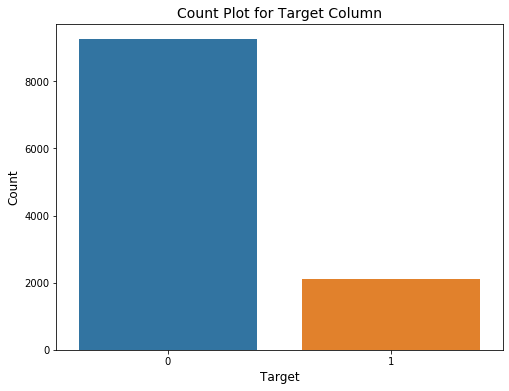

In [42]:
# Count plot for the target

ax = plt.figure(figsize = (8, 6))
ax = sns.countplot(df['target'])
ax.set_title('Count Plot for Target Column', fontsize = 14)
ax.set_xlabel('Target', fontsize = 12)
ax.set_ylabel('Count', fontsize = 12)
plt.show();

#### Most Common Words Plot

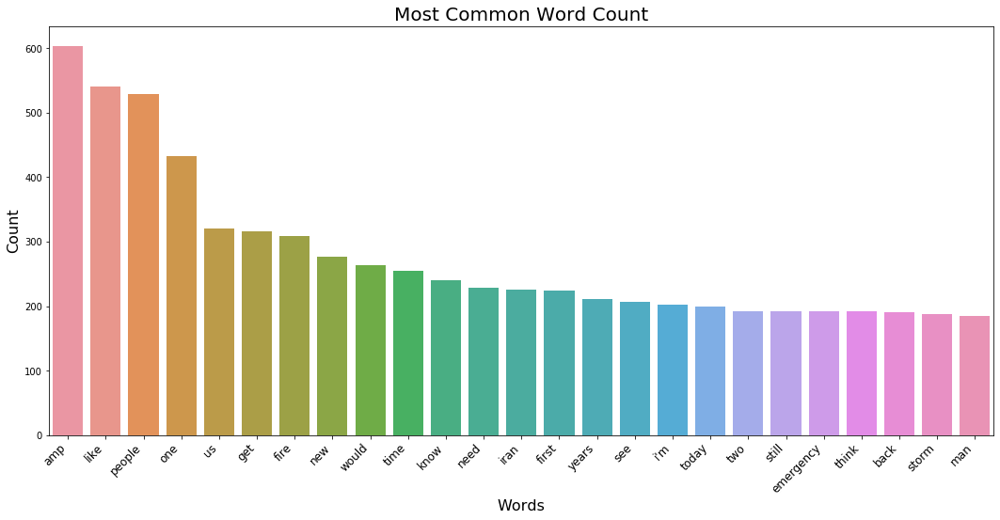

In [43]:
# Create barplot of most common words

barplot(most_common_words_df, 'word', 'count', 'Most Common Word Count', 'Words', 'Count')

#### Bigram Plot

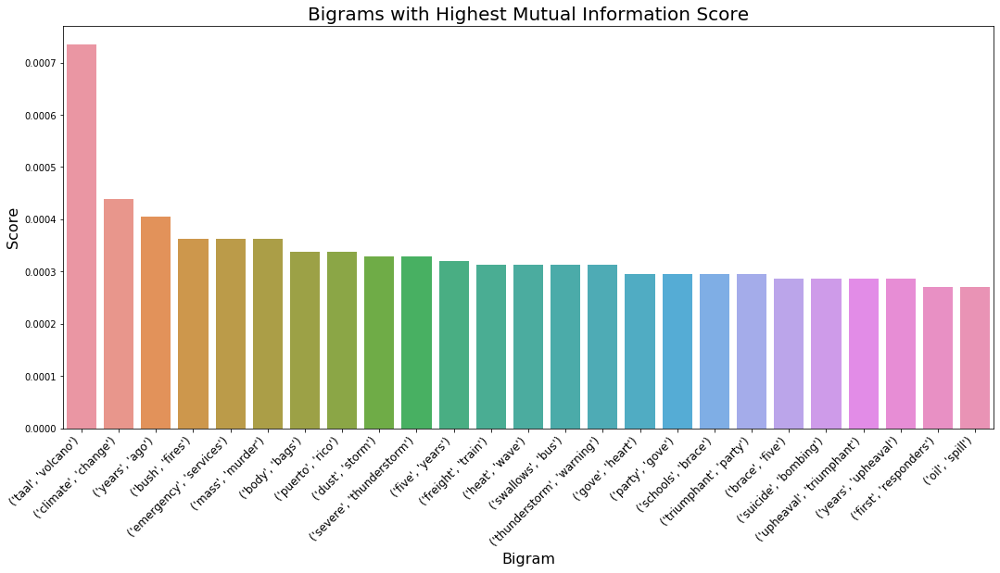

In [44]:
# Barplot of top 25 bigrams 

barplot(bigram_df, 'bigram', 'freq', 'Bigrams with Highest Mutual Information Score',
        'Bigram', 'Score')

## Model

 <div class="alert alert-info" role="alert">
Modeling was broken up into two phases: Classifiers & Neural Networks.
    </div>

### Classifier Models

#### Logistic Regression

                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.90      0.92      1872
           1       0.61      0.76      0.68       402

    accuracy                           0.87      2274
   macro avg       0.78      0.83      0.80      2274
weighted avg       0.89      0.87      0.88      2274



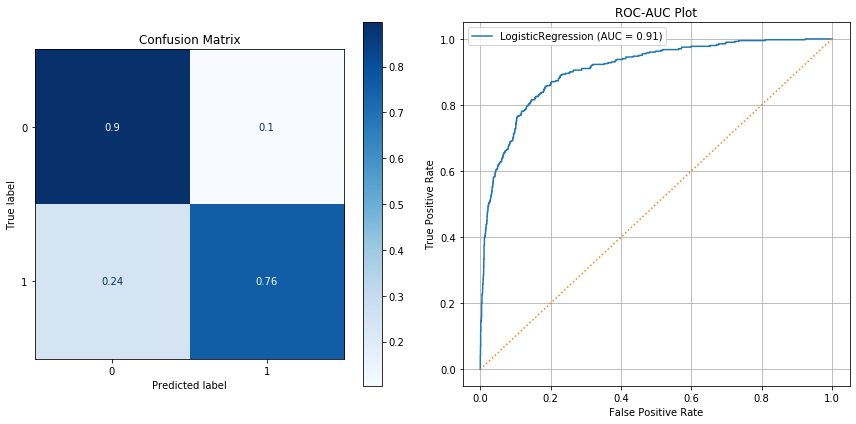

In [45]:
from sklearn.linear_model import LogisticRegression

# Putting together a base Logistic Regression

logreg = LogisticRegression(class_weight = 'balanced')
logreg.fit(X_train_processed, y_train)

# Evaluate model
evaluate_classifier(logreg, X_test_processed, y_test)

In [46]:
from sklearn.model_selection import GridSearchCV

# Let's run a gridsearch to get the best hyperparameters
params = {'class_weight': ['balanced'],
          'solver': ['lbfgs', 'liblinear'],
          'C': [1.0, 3.0, 5.0]}
grid = GridSearchCV(estimator = LogisticRegression(), 
                    param_grid = params, 
                    cv = 3, 
                    n_jobs = -1)
grid.fit(X_train_processed, y_train)

# Score with recall

GridSearchCV(cv=3, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': [1.0, 3.0, 5.0], 'class_weight': ['balanced'],
                         'solver': ['lbfgs', 'liblinear']})

In [47]:
# Taking a look at the best paramaters.

print(grid.best_estimator_.get_params())

{'C': 5.0, 'class_weight': 'balanced', 'dual': False, 'fit_intercept': True, 'intercept_scaling': 1, 'l1_ratio': None, 'max_iter': 100, 'multi_class': 'auto', 'n_jobs': None, 'penalty': 'l2', 'random_state': None, 'solver': 'lbfgs', 'tol': 0.0001, 'verbose': 0, 'warm_start': False}


                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.91      0.92      1872
           1       0.63      0.72      0.67       402

    accuracy                           0.88      2274
   macro avg       0.78      0.82      0.80      2274
weighted avg       0.88      0.88      0.88      2274



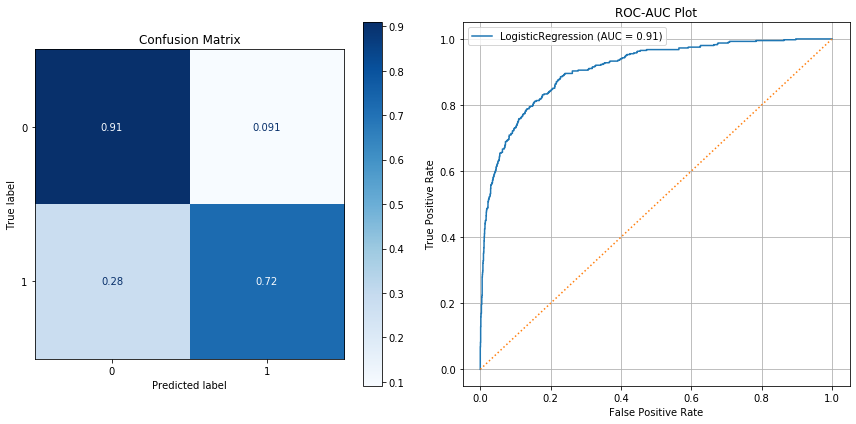

In [48]:
# Fit the best model
best_logreg_params = grid.best_params_
best_logreg_model = LogisticRegression(**best_logreg_params)
best_logreg_model.fit(X_train_processed, y_train)

# Evaluate model
evaluate_classifier(best_logreg_model, X_test_processed, y_test)

 <div class="alert alert-info" role="alert">
The Logistic Regression did surprisingly well!  In fact, the baseline logistic regression performed better before a gridsearch.
    </div>

#### SGD Classifier

                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.90      0.92      1872
           1       0.62      0.73      0.67       402

    accuracy                           0.87      2274
   macro avg       0.78      0.82      0.80      2274
weighted avg       0.88      0.87      0.88      2274



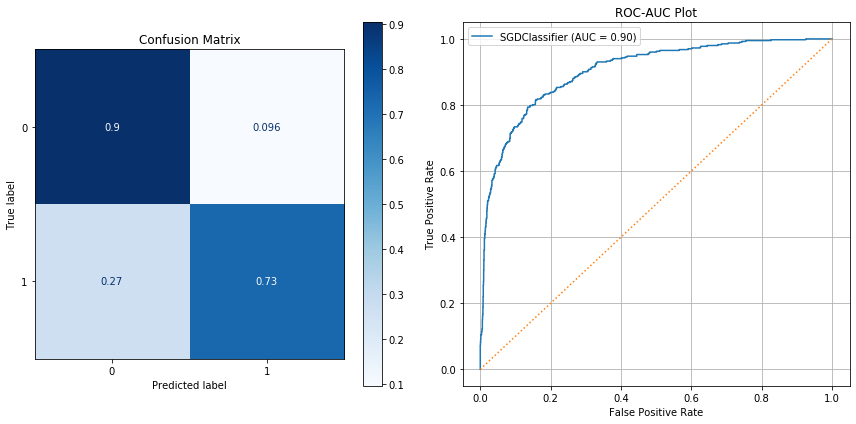

In [49]:
from sklearn.linear_model import SGDClassifier

# Fit a baseline SGDClassifier
bayes = SGDClassifier(class_weight = 'balanced', random_state = 30)
bayes.fit(X_train_processed, y_train)

# Evaluate Model
evaluate_classifier(bayes, X_test_processed, y_test)

In [50]:
# Let's do a gridsearch with this thing

params = {'class_weight': ['balanced'],
          'random_state': [30],
          'loss': ['hinge', 'perceptron'],
          'penalty': ['l1', 'l2']}
grid = GridSearchCV(estimator = SGDClassifier(), 
                    param_grid = params, 
                    cv = 3, 
                    n_jobs = -1)
grid.fit(X_train_processed, y_train)

GridSearchCV(cv=3, estimator=SGDClassifier(), n_jobs=-1,
             param_grid={'class_weight': ['balanced'],
                         'loss': ['hinge', 'perceptron'],
                         'penalty': ['l1', 'l2'], 'random_state': [30]})

In [51]:
# Check out the best parameters
print(grid.best_estimator_.get_params())

{'alpha': 0.0001, 'average': False, 'class_weight': 'balanced', 'early_stopping': False, 'epsilon': 0.1, 'eta0': 0.0, 'fit_intercept': True, 'l1_ratio': 0.15, 'learning_rate': 'optimal', 'loss': 'hinge', 'max_iter': 1000, 'n_iter_no_change': 5, 'n_jobs': None, 'penalty': 'l2', 'power_t': 0.5, 'random_state': 30, 'shuffle': True, 'tol': 0.001, 'validation_fraction': 0.1, 'verbose': 0, 'warm_start': False}


                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.94      0.90      0.92      1872
           1       0.62      0.73      0.67       402

    accuracy                           0.87      2274
   macro avg       0.78      0.82      0.80      2274
weighted avg       0.88      0.87      0.88      2274



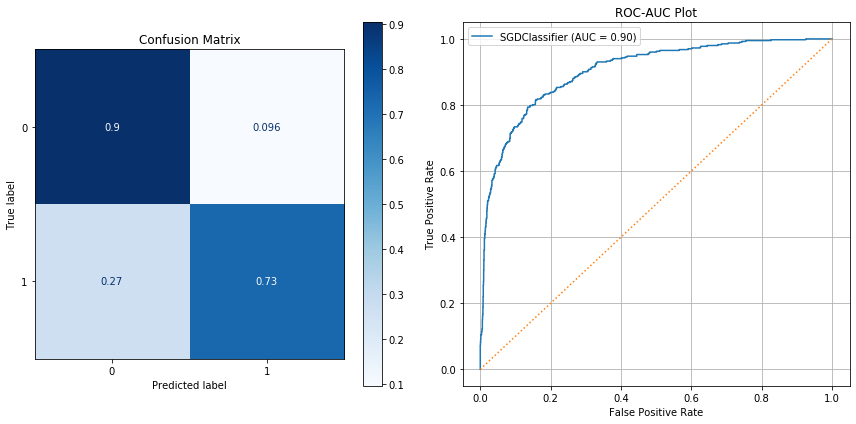

In [52]:
# Fit the best model

best_sgd_params = grid.best_params_
best_sgd_model = SGDClassifier(**best_sgd_params)
best_sgd_model.fit(X_train_processed, y_train)

# Evaluate model
evaluate_classifier(best_sgd_model, X_test_processed, y_test)

 <div class="alert alert-info" role="alert">
The SGD also did rather well.  The Logistic Regression slightly edges it out in terms of recall. 
    </div>

#### Random Forest

                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.89      0.98      0.93      1872
           1       0.85      0.42      0.56       402

    accuracy                           0.88      2274
   macro avg       0.87      0.70      0.75      2274
weighted avg       0.88      0.88      0.87      2274



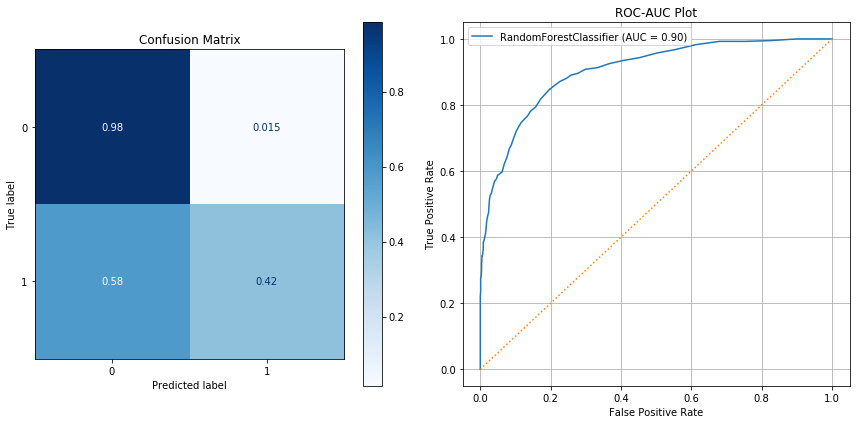

In [53]:
# Random Forest Classifier
from sklearn.ensemble import RandomForestClassifier

forest = RandomForestClassifier(class_weight = 'balanced', random_state = 30)
forest.fit(X_train_processed, y_train)

# Get Predictions & Evaluate
evaluate_classifier(forest, X_test_processed, y_test)

In [115]:
# Gridsearch for Random Forest
params = {'class_weight': ['balanced', 'balanced_subsample'],
          'random_state': [30],
          'n_estimators': [100, 250, 500],
          'criterion': ['gini', 'entropy'], 
          'max_depth': [5, 10, 20, 50], 
          'min_samples_leaf': [1, 5, 10],
          'min_samples_split': [2, 5, 10],
          'max_features': ['auto', 'sqrt', 'log2'], 
          'max_leaf_nodes': [None, 5, 10]}
grid = GridSearchCV(estimator = RandomForestClassifier(),
                    param_grid = params, 
                    cv = 3, 
                    n_jobs = -1)
grid.fit(X_train_processed, y_train)

GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'class_weight': ['balanced', 'balanced_subsample'],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [5, 10, 20, 50],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'max_leaf_nodes': [None, 5, 10],
                         'min_samples_leaf': [1, 5, 10],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 250, 500],
                         'random_state': [30]})

In [116]:
# Checking the best hyperparameters

print(grid.best_estimator_.get_params())

{'bootstrap': True, 'ccp_alpha': 0.0, 'class_weight': 'balanced_subsample', 'criterion': 'gini', 'max_depth': 50, 'max_features': 'log2', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_impurity_split': None, 'min_samples_leaf': 1, 'min_samples_split': 10, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 500, 'n_jobs': None, 'oob_score': False, 'random_state': 30, 'verbose': 0, 'warm_start': False}


                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.90      0.98      0.94      1872
           1       0.83      0.51      0.63       402

    accuracy                           0.89      2274
   macro avg       0.87      0.74      0.79      2274
weighted avg       0.89      0.89      0.88      2274



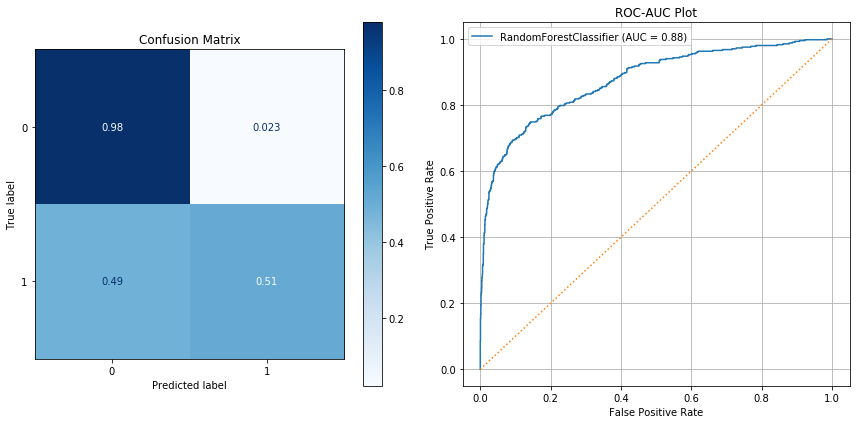

In [117]:
# Fit a new model with the best paramaters from GridSearchCV

best_rf_params = grid.best_params_
best_rf_model = RandomForestClassifier(**best_rf_params)
best_rf_model.fit(X_train_processed, y_train)

# Evaluate the model
evaluate_classifier(best_rf_model, X_test_processed, y_test)

 <div class="alert alert-info" role="alert">
Random Forest was fairly accurate but didn't do well in terms of recall. 
    </div>

#### XGBoost - Commented Out For Now

                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.84      0.99      0.91      1872
           1       0.84      0.14      0.24       402

    accuracy                           0.84      2274
   macro avg       0.84      0.57      0.58      2274
weighted avg       0.84      0.84      0.79      2274



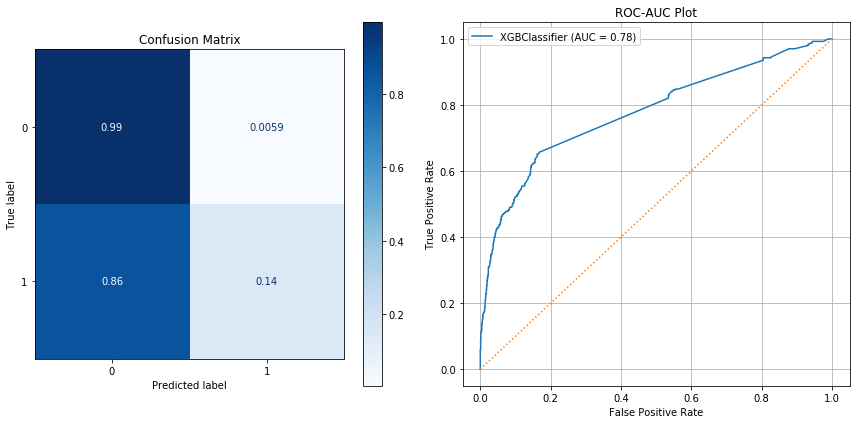

In [118]:
from xgboost import XGBClassifier

# Build and fit a basic XGBoost
xgb = XGBClassifier()
xgb.fit(X_train_processed, y_train)

# Evaluate the model
evaluate_classifier(xgb, X_test_processed, y_test)

In [119]:
X_train[0]

'Communal violence in Bhainsa, Telangana. "Stones were pelted on Muslims\' houses and some houses and vehicles were set ablaze…'

In [120]:
# Let's do a gridsearch for this 

params = {'gamma': [0.5, 1, 5],
          'booster': ['gbtree', 'gblinear'],
          'min_child_weight': [1, 5, 10],
          'max_depth': [3, 5],
          'scale_pos_weight': [1, 1000]}
grid = GridSearchCV(estimator = XGBClassifier(), 
                    param_grid = params, 
                    cv = 3, 
                    n_jobs = -1)
grid.fit(X_train_processed, y_train)

GridSearchCV(cv=3, estimator=XGBClassifier(), n_jobs=-1,
             param_grid={'booster': ['gbtree', 'gblinear'],
                         'gamma': [0.5, 1, 5], 'max_depth': [3, 5],
                         'min_child_weight': [1, 5, 10],
                         'scale_pos_weight': [1, 1000]})

In [121]:
# Get best parameters
print(grid.best_estimator_.get_params())


{'base_score': 0.5, 'booster': 'gbtree', 'colsample_bylevel': 1, 'colsample_bynode': 1, 'colsample_bytree': 1, 'gamma': 1, 'learning_rate': 0.1, 'max_delta_step': 0, 'max_depth': 5, 'min_child_weight': 1, 'missing': None, 'n_estimators': 100, 'n_jobs': 1, 'nthread': None, 'objective': 'binary:logistic', 'random_state': 0, 'reg_alpha': 0, 'reg_lambda': 1, 'scale_pos_weight': 1, 'seed': None, 'silent': None, 'subsample': 1, 'verbosity': 1}


In [123]:
# Fit a new model with the best parameters

best_xgb_params = grid.best_params_
best_xgb_model = XGBClassifier(**best_xgb_params, random_state = 30)
best_xgb_model.fit(X_train_processed, y_train)

XGBClassifier(gamma=1, max_depth=5, random_state=30)

                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.85      0.99      0.92      1872
           1       0.84      0.18      0.30       402

    accuracy                           0.85      2274
   macro avg       0.84      0.59      0.61      2274
weighted avg       0.85      0.85      0.81      2274



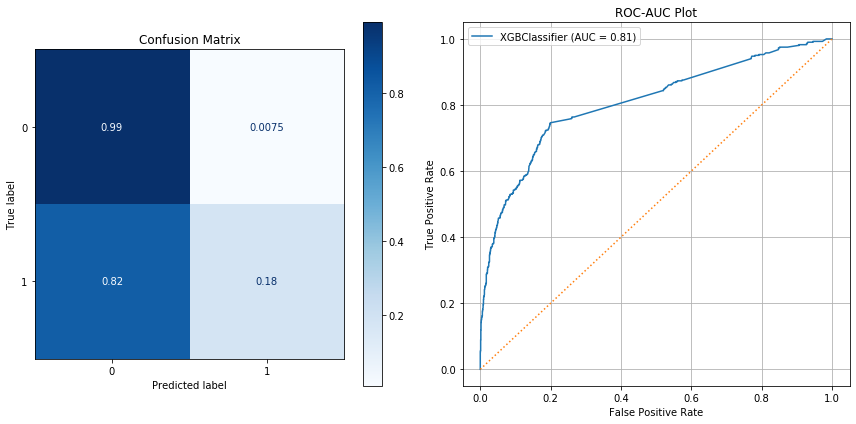

In [124]:
# Evaluate model

evaluate_classifier(best_xgb_model, X_test_processed, y_test)

#### Stacking Classifier

                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.93      0.93      0.93      1872
           1       0.69      0.68      0.68       402

    accuracy                           0.89      2274
   macro avg       0.81      0.81      0.81      2274
weighted avg       0.89      0.89      0.89      2274



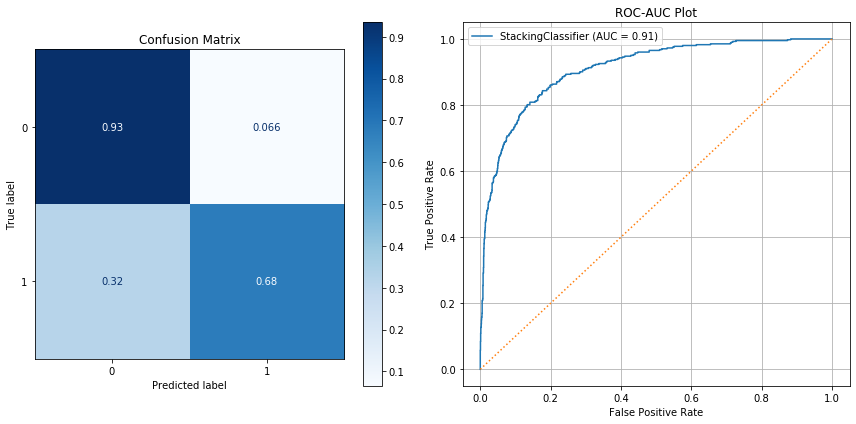

In [63]:
from sklearn.ensemble import StackingClassifier

# Fit the stacking classifier
estimators = [('logreg', logreg),
              ('sgd', best_sgd_model)]
             # ('rf', best_rf_model)]
#               ('xg', best_xgb_model)]

stack = StackingClassifier(estimators = estimators, cv = 3, n_jobs = -1)
stack.fit(X_train_processed, y_train)

# Evaluate the model
evaluate_classifier(stack, X_test_processed, y_test)

# look up voting clasifier 

 <div class="alert alert-info" role="alert">
Surprisngly, the stack of the Logistic Regression and SGD didn't do as well as the simple Logistic Regression model.
    </div>

#### Conclusion

 <div class="alert alert-info" role="alert">
Going to have to go over the results of this but it seems like the best models were Logistic Regression and SGD Classifier.  We can pull the most important features from this and interpret these results a little more closely.
    </div>

In [64]:
print('Recall Scores for Each Model')
print('------------------------------')
print('Logistic Regression: ', round(get_recall(logreg, X_test_processed, y_test), 2))
print('SGD: ', round(get_recall(best_sgd_model, X_test_processed, y_test), 2))
print('Random Forest: ', round(get_recall(best_rf_model, X_test_processed, y_test), 2))
print('Stacking Classifier: ', round(get_recall(stack, X_test_processed, y_test), 2))

Recall Scores for Each Model
------------------------------
Logistic Regression:  0.76
SGD:  0.73
Random Forest:  0.53
Stacking Classifier:  0.68


### Neural Networks - First Attempt

 <div class="alert alert-info" role="alert">
The neural networks in this section represent the results of a HIGHLY iterative process where we attempted literally hundreds of combinations of layers, parameters, preprocessing methods, optimizers, activation functions, and basically any tunable paramter you can think of.  Results varied greatly and we also encountered an odd phenomenon where the model would seem to be highly accurate but would not produce accurate predictions.  The following represents a compromise between getting decent predictions and allowing a bit of overfitting.  This is something that will be rectified in later versions of this notebook. 
    </div>

#### Preprocessing for RNN

In [65]:
# Making sure X & y still exist

print(X)
print(y)

0        Communal violence in Bhainsa, Telangana. "Ston...
1        Telangana: Section 144 has been imposed in Bha...
2        Arsonist sets cars ablaze at dealership https:...
3        Arsonist sets cars ablaze at dealership https:...
4        "Lord Jesus, your love brings freedom and pard...
                               ...                        
11365    Media should have warned us well in advance. T...
11366    i feel directly attacked 💀 i consider moonbin ...
11367    i feel directly attacked 💀 i consider moonbin ...
11368    ok who remember "outcast" nd the "dora" au?? T...
11369       Jake Corway wrecked while running 14th at IRP.
Name: text, Length: 11370, dtype: object
0        1
1        1
2        1
3        1
4        0
        ..
11365    0
11366    0
11367    0
11368    0
11369    1
Name: target, Length: 11370, dtype: int64


##### Testing for a cleaning function

In [66]:
# Creating new X & Y

text_data = df['text'].copy()
y = df['target'].values

y.shape

(11370,)

In [67]:
# Remove Stop words 
text_data = [word for word in text_data if word not in stop_words_list]

# Create & fit a tokenizer
tokenizer = Tokenizer()
tokenizer.fit_on_texts(text_data)

# Create a text sequence
X = tokenizer.texts_to_sequences(text_data)
X = sequence.pad_sequences(X)

# Save the length of X
sequence_length = X.shape[1]

# Save words
word_index = tokenizer.index_word
reverse_index = {v:k for k, v in word_index.items()}

In [68]:
# Create new train_test_split
X_train_nn, X_test_nn, y_train_nn, y_test_nn = train_test_split(X, y, test_size = 0.2, 
                                                                random_state = 30, stratify = y)

print('X_train shape is', X_train_nn.shape)
print('X_test shape is', X_test_nn.shape)
print('y_train shape is', y_train_nn.shape)
print('y_test shape is', y_test_nn.shape)


X_train shape is (9096, 33)
X_test shape is (2274, 33)
y_train shape is (9096,)
y_test shape is (2274,)


In [69]:
# Checking Class Weights

y_train_df = pd.DataFrame(y_train_nn)
y_train_df[0].value_counts(1)

0    0.814094
1    0.185906
Name: 0, dtype: float64

In [70]:
# SMOTE

undersample = SMOTE(sampling_strategy = 0.1)
X_train_resampled_nn, y_train_resampled_nn = SMOTE().fit_resample(X_train_nn, y_train_nn) 

In [71]:
weight_labels = df['target'].copy()

In [72]:
# Dealing with class imbalance
from sklearn.utils.class_weight import compute_class_weight

weights = compute_class_weight('balanced', np.unique(weight_labels), weight_labels)
weights = dict(zip(np.unique(weight_labels), weights))
weights

/Users/spags/opt/anaconda3/envs/learn-env/lib/python3.6/site-packages/sklearn/utils/validation.py:70: FutureWarning: Pass classes=[0 1], y=0        1
1        1
2        1
3        1
4        0
        ..
11365    0
11366    0
11367    0
11368    0
11369    1
Name: target, Length: 11370, dtype: int64 as keyword args. From version 0.25 passing these as positional arguments will result in an error
  FutureWarning)


{0: 0.6141961970613656, 1: 2.6892147587511825}

##### GloVe - Revisit - File deleted - Commented Out

In [73]:
# GloVe embeddings kept killing the kernel.  Revisit this as well.

# import os

# glove = {}
# f = open(os.path.join('glove.twitter.27B.25d.txt'))
# for line in f:
#     values = line.split()
#     word = values[0]
#     coefs = np.asarray(values[1:], dtype='float32')
#     glove[word] = coefs
# f.close()

# embedding_dim = len(glove)

# print('Found %s word vectors.' % len(glove))

In [74]:
# glove_matrix = np.zeros((len(word_index) + 1, embedding_dim))
# for word, i in word_index.items():
#     embedding_vector = glove.get(word)
#     if embedding_vector is not None:
#         # words not found in embedding index will be all-zeros.
#         glove_matrix[i] = embedding_vector

#### LSTM Model

 <div class="alert alert-info" role="alert">
Below is an LSTM sequence model and this represents the final result (best model) of many, many iterations of various combinations of architectures and hyperparameters.  
    </div>

Epoch 1/25
100/100 [==============================] - 57s 571ms/step - loss: 6.1291 - acc: 0.5594 - val_loss: 0.6598 - val_acc: 0.7699
Epoch 2/25
100/100 [==============================] - 54s 540ms/step - loss: 0.5803 - acc: 0.7586 - val_loss: 0.4931 - val_acc: 0.7999
Epoch 3/25
100/100 [==============================] - 54s 537ms/step - loss: 0.4559 - acc: 0.8365 - val_loss: 0.4640 - val_acc: 0.8351
Epoch 4/25
100/100 [==============================] - 53s 534ms/step - loss: 0.3945 - acc: 0.8670 - val_loss: 0.3978 - val_acc: 0.8523
                 Model Evaluation
-------------------------------------------------------
72/72 [==============================] - 5s 75ms/step - loss: 0.6584 - acc: 0.7753
[0.6584351658821106, 0.7752858400344849]
 
                 Loss & Accuracy Curves
-------------------------------------------------------


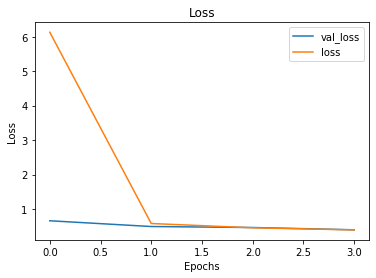

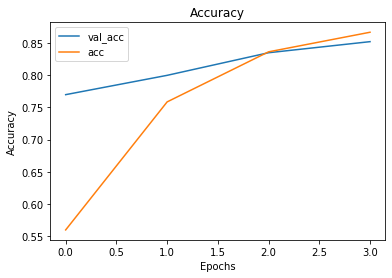

 
                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.90      0.81      0.85      1851
           1       0.43      0.63      0.51       423

    accuracy                           0.78      2274
   macro avg       0.67      0.72      0.68      2274
weighted avg       0.82      0.78      0.79      2274

 
                 Confusion Matrix
-------------------------------------------------------


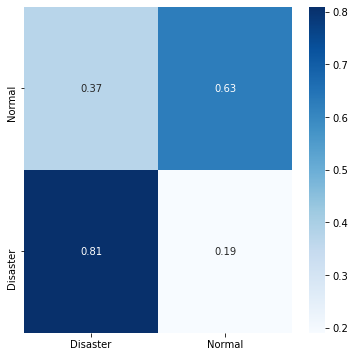

In [75]:
# Early Stopping 
callback = EarlyStopping(monitor = 'val_acc', patience = 3, mode = 'max', 
                         min_delta = .1, restore_best_weights = True)

# Create a base neural network
model = Sequential()

# Embedding layer
model.add(Embedding(input_dim = len(tokenizer.word_index) + 1, 
                           input_length = sequence_length, 
                           output_dim = 100)) 

# Broke computer - Try again Later
# model.add(Embedding(input_dim = len(tokenizer.word_index) + 1, 
#                     weights = [glove_matrix],
#                     input_length = sequence_length, 
#                     output_dim = embedding_dim, trainable = False))

model.add(SpatialDropout1D(0.3))

# Hidden Layers
model.add(Bidirectional(LSTM(activation = 'tanh', units = 256, dropout = 0.3, 
                             recurrent_dropout = 0.3, kernel_regularizer = regularizers.l2(.1))))

# model.add(LSTM(activation = 'relu', units = 256, dropout = 0.3, 
#                              recurrent_dropout = 0.3, kernel_regularizer = regularizers.l2(.1)))
# model.add(Dropout(0.3))

model.add(Dense(128, activation = 'relu'))
model.add(Dropout(0.3))

model.add(Dense(64, activation = 'tanh'))
model.add(Dropout(0.3))

model.add(Dense(32, activation = 'tanh'))
model.add(Dropout(0.3)) 

# model.add(LeakyReLU(alpha = 0.1))
# model.add(Dropout(0.3))

# Output layer
model.add(Dense(1, activation = 'sigmoid'))

# Compile
model.compile(optimizer = 'RMSProp', loss = 'binary_crossentropy', metrics = ['acc'])

# Fit model
history = model.fit(X_train_nn, y_train_nn, batch_size = 64, epochs = 25, 
                    validation_split = 0.3, callbacks = callback, class_weight = weights) 

# Evaluating the model 
evaluate_network(history, model, X_test_nn, y_test_nn)


In [76]:
# Get predictions

model1_preds = model.predict(X_test_nn).round()
model1_preds_df = pd.DataFrame(model1_preds)
model1_preds_df[0].value_counts()

0.0    1656
1.0     618
Name: 0, dtype: int64

In [77]:
# Compare with the actual target values

model_true_df = pd.DataFrame(y_test)
model_true_df['target'].value_counts()

0    1872
1     402
Name: target, dtype: int64

##### Conclusion

 <div class="alert alert-info" role="alert">
 After going through literally hundreds of different combinations of parameters, this was the best result that we were able to get to.  Not fantastic, but still better than random guessing.
    </div>

### Neural Networks - Second Attempt

 <div class="alert alert-info" role="alert">
After what seemed like an eternity of reworking the previous neural networks with no improvement in either accuracy or the predictions issue, we decided to start fresh with a different method of preprocessing to see if maybe the issue was pre-modeling.  The neural network below was less iterative than the previous models as it was more of an experiment in preprocessing.
    </div>

#### Preprocessing

In [78]:
# Making sure we still have a clean dataframe.

df.head()

,keyword,text,target
0,ablaze,"Communal violence in Bhainsa, Telangana. ""Ston...",1
1,ablaze,Telangana: Section 144 has been imposed in Bha...,1
2,ablaze,Arsonist sets cars ablaze at dealership https:...,1
3,ablaze,Arsonist sets cars ablaze at dealership https:...,1
4,ablaze,"""Lord Jesus, your love brings freedom and pard...",0


In [79]:
# Create a new X & y and do "manual preprocessing"

X = df['text'].copy()
y_new = df['target'].copy()

X_new = X.map(lambda x: remove_url(x))
X_new = X_new.map(lambda x: remove_html(x))
XX_new= X_new.map(lambda x: remove_emoji(x))
X_new = X_new.map(lambda x: remove_punctuation(x))

X_new

0        Communal violence in Bhainsa Telangana Stones ...
1        Telangana Section 144 has been imposed in Bhai...
2                 Arsonist sets cars ablaze at dealership 
3                Arsonist sets cars ablaze at dealership  
4        Lord Jesus your love brings freedom and pardon...
                               ...                        
11365    Media should have warned us well in advance Th...
11366    i feel directly attacked 💀 i consider moonbin ...
11367    i feel directly attacked 💀 i consider moonbin ...
11368    ok who remember outcast nd the dora au THOSE A...
11369        Jake Corway wrecked while running 14th at IRP
Name: text, Length: 11370, dtype: object

In [80]:
# Remove stopwords 

X_new = X_new.map(remove_stopwords)
X_new

0        communal violence bhainsa telangana stones pel...
1        telangana section 144 imposed bhainsa january ...
2                     arsonist sets cars ablaze dealership
3                     arsonist sets cars ablaze dealership
4        lord jesus love brings freedom pardon fill hol...
                               ...                        
11365    media warned us well advance wrecked whole nig...
11366    feel directly attacked 💀 consider moonbin amp ...
11367    feel directly attacked 💀 consider moonbin amp ...
11368    ok remember outcast nd dora au au wrecked nerv...
11369                 jake corway wrecked running 14th irp
Name: text, Length: 11370, dtype: object

In [81]:
# Create a counter as an alternative to FreqDist

from collections import Counter

def counter_word(text):
    '''Creates a counter for each word in text data'''
    count = Counter()
    for i in text.values:
        for word in i.split():
            count[word] += 1
    
    return count

In [82]:
# Implement the counter function

counter = counter_word(X_new)
print('Total Number of Words:', len(counter))
counter

Total Number of Words: 25889


Counter({'communal': 4,
         'violence': 30,
         'bhainsa': 14,
         'telangana': 13,
         'stones': 8,
         'pelted': 4,
         'muslims': 20,
         'houses': 32,
         'vehicles': 17,
         'set': 76,
         'ablaze…': 2,
         'section': 9,
         '144': 1,
         'imposed': 2,
         'january': 73,
         '13': 39,
         '15': 50,
         'clash': 8,
         'erupted': 9,
         'two': 177,
         'groups': 12,
         '12': 31,
         'po…': 9,
         'arsonist': 13,
         'sets': 8,
         'cars': 17,
         'ablaze': 22,
         'dealership': 2,
         'lord': 18,
         'jesus': 28,
         'love': 135,
         'brings': 11,
         'freedom': 16,
         'pardon': 1,
         'fill': 3,
         'holy': 14,
         'spirit': 4,
         'heart': 91,
         'l…': 30,
         'child': 33,
         'chinese': 28,
         'tweet': 41,
         'would': 252,
         'gone': 30,
         'viral': 8,
   

In [83]:
# Set num_words and max_length

num_words = len(counter)

max_length = 80 # Totally arbitrary number

In [84]:
# Train/Test Split
# video reference: train_sentences, train_labels, test_sentences, test labels

X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(X_new, y_new, test_size = 0.2, random_state = 30)

In [85]:
# Create tokenizer

tokenizer = Tokenizer(num_words = num_words)
tokenizer.fit_on_texts(X_train_2)

In [86]:
# Create sequences 

train_sequences = tokenizer.texts_to_sequences(X_train_2)
train_sequences[0]

[4, 5722, 104, 10, 57, 775, 1215]

In [87]:
# Create a word index

word_index = tokenizer.word_index
word_index

{'amp': 1,
 'like': 2,
 'people': 3,
 'one': 4,
 'us': 5,
 'get': 6,
 'new': 7,
 'fire': 8,
 'im': 9,
 'would': 10,
 'time': 11,
 'know': 12,
 'need': 13,
 'first': 14,
 'see': 15,
 'years': 16,
 '2': 17,
 'still': 18,
 'iran': 19,
 'dont': 20,
 't…': 21,
 'think': 22,
 'today': 23,
 'emergency': 24,
 'two': 25,
 'it’s': 26,
 'back': 27,
 'storm': 28,
 '1': 29,
 'i’m': 30,
 'many': 31,
 'want': 32,
 'news': 33,
 'day': 34,
 'fires': 35,
 'man': 36,
 'body': 37,
 'australia': 38,
 'please': 39,
 'got': 40,
 'go': 41,
 'also': 42,
 'trump': 43,
 'really': 44,
 'nuclear': 45,
 '…': 46,
 'killed': 47,
 'said': 48,
 'could': 49,
 'last': 50,
 'help': 51,
 'attack': 52,
 'say': 53,
 'right': 54,
 'never': 55,
 'much': 56,
 'love': 57,
 'good': 58,
 'going': 59,
 'police': 60,
 'world': 61,
 'a…': 62,
 'volcano': 63,
 'even': 64,
 'taal': 65,
 'death': 66,
 'another': 67,
 'year': 68,
 '2020': 69,
 'don’t': 70,
 'due': 71,
 'take': 72,
 'bomb': 73,
 'come': 74,
 'every': 75,
 '3': 76,
 'make'

In [88]:
# Making sure this worked

X_train_2[0]

'communal violence bhainsa telangana stones pelted muslims houses houses vehicles set ablaze…'

In [89]:
# Create padded sequences for training set

from keras.preprocessing.sequence import pad_sequences

train_padded = pad_sequences(train_sequences, maxlen = max_length, padding = 'post', truncating = 'post')
train_padded[0]

array([   4, 5722,  104,   10,   57,  775, 1215,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0], dtype=int32)

In [90]:
# Create wod and padding sequence for test set

test_sequences = tokenizer.texts_to_sequences(X_test_2)
test_padded = pad_sequences(test_sequences, maxlen = max_length, padding = 'post', truncating = 'post')

In [91]:
# Create a way to get it back to words

reverse_word_index = dict([(value, key) for (key, value) in word_index.items()])

def decode_sequence(text):
    '''Returns a sequence back to human words'''
    return " ".join([reverse_word_index.get(i, '?') for i in text])

decode_sequence(train_sequences[1])

'pubg provide unmitigated blizzard goop'

In [92]:
# Testing 

train_sequences[1]

[9133, 1143, 9134, 740, 9135]

In [93]:
# Testing

word_index['pubg']

9133

In [94]:
# Get some shapes

print('Train Shape:', train_padded.shape)
print('Test Shape:', test_padded.shape)

Train Shape: (9096, 80)
Test Shape: (2274, 80)


#### Modeling

Epoch 1/25
100/100 [==============================] - 128s 1s/step - loss: 6.1342 - acc: 0.4880 - val_loss: 0.7141 - val_acc: 0.1847
Epoch 2/25
100/100 [==============================] - 118s 1s/step - loss: 0.6742 - acc: 0.5890 - val_loss: 0.5572 - val_acc: 0.8117
Epoch 3/25
100/100 [==============================] - 107s 1s/step - loss: 0.4628 - acc: 0.8502 - val_loss: 0.4711 - val_acc: 0.8252
Epoch 4/25
100/100 [==============================] - 107s 1s/step - loss: 0.3871 - acc: 0.8791 - val_loss: 0.4046 - val_acc: 0.8597
Epoch 5/25
100/100 [==============================] - 107s 1s/step - loss: 0.3457 - acc: 0.8929 - val_loss: 0.3752 - val_acc: 0.8633
                 Model Evaluation
-------------------------------------------------------
72/72 [==============================] - 9s 129ms/step - loss: 0.5177 - acc: 0.8549
[0.5176794528961182, 0.8548812866210938]
 
                 Loss & Accuracy Curves
-------------------------------------------------------


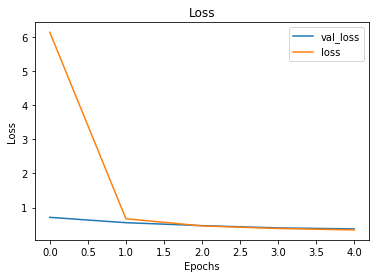

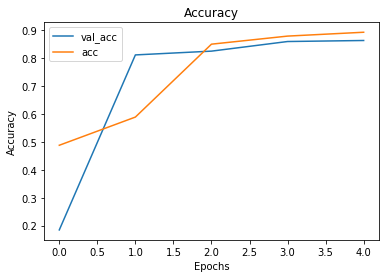

 
                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.92      0.90      0.91      1872
           1       0.58      0.63      0.61       402

    accuracy                           0.85      2274
   macro avg       0.75      0.77      0.76      2274
weighted avg       0.86      0.85      0.86      2274

 
                 Confusion Matrix
-------------------------------------------------------


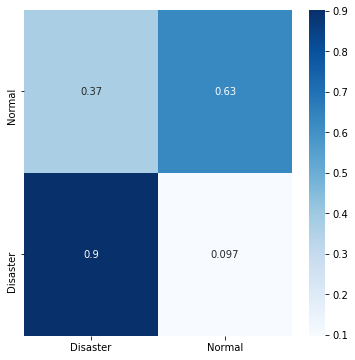

In [95]:
# Early Stopping 
callback = EarlyStopping(monitor = 'val_acc', patience = 3, mode = 'max', 
                         min_delta = .1, restore_best_weights = True)

# Create a base neural network
model4 = Sequential()

# Embedding layer
model4.add(Embedding(input_dim = len(word_index) + 1, 
                           input_length = max_length, 
                           output_dim = 100))
model4.add(SpatialDropout1D(0.3))

# Hidden Layers
model4.add(Bidirectional(LSTM(activation = 'tanh', units = 256, dropout = 0.3, 
                             recurrent_dropout = 0.3, kernel_regularizer = regularizers.l2(.1))))
# model4.add(Dropout(0.3))

model4.add(Dense(128, activation = 'tanh'))
model4.add(Dropout(0.3))

model4.add(Dense(64, activation = 'tanh'))
model4.add(Dropout(0.3))

model4.add(Dense(32, activation = 'tanh'))
model4.add(Dropout(0.3))

model4.add(LeakyReLU(alpha = 0.1))
# model4.add(Dropout(0.3))

# Output layer
model4.add(Dense(1, activation = 'sigmoid'))

# Compile
model4.compile(optimizer = 'RMSProp', loss = 'binary_crossentropy', metrics = ['acc'])

# Fit 
history4 = model4.fit(train_padded, y_train_2, batch_size = 64,
                      epochs = 25, validation_split = 0.3, callbacks = callback, 
                      class_weight = weights)

# Evaluate
evaluate_network(history4, model4, test_padded, y_test_2)

In [96]:
# Get Predictions
model4_preds = model4.predict_on_batch(test_padded).round()
model4_preds_df = pd.DataFrame(model4_preds)
print(model4_preds_df[0].value_counts())

0.0    1838
1.0     436
Name: 0, dtype: int64


 <div class="alert alert-info" role="alert">
This performed slightly better than the first time around.  Definitely still needs work.  
    </div>

### New LSTM - 12/16

> <b>12/16/20</b> - 
I'm revisitng this project after a couple of months and I believe that, with more experience in neural networks, I will be able to increase the accuracy of this model by experimenting more with the architecture and giving a GRU model a shot as well once I exhaust the LSTM options.

Epoch 1/50
50/50 [==============================] - 288s 6s/step - loss: 34544113680384.0000 - acc: 0.5103 - val_loss: 1.9369 - val_acc: 0.8575
Epoch 2/50
50/50 [==============================] - 281s 6s/step - loss: 1.8659 - acc: 0.8575 - val_loss: 1.8047 - val_acc: 0.8142
Epoch 3/50
50/50 [==============================] - 333s 7s/step - loss: 1.7125 - acc: 0.8902 - val_loss: 1.6894 - val_acc: 0.8369
Epoch 4/50
50/50 [==============================] - 338s 7s/step - loss: 1.6031 - acc: 0.9103 - val_loss: 1.6562 - val_acc: 0.8454
Epoch 5/50
50/50 [==============================] - 348s 7s/step - loss: 1.5358 - acc: 0.9254 - val_loss: 1.6540 - val_acc: 0.8560
Epoch 6/50
50/50 [==============================] - 309s 6s/step - loss: 1.4926 - acc: 0.9409 - val_loss: 1.6438 - val_acc: 0.8520
                 Model Evaluation
-------------------------------------------------------
72/72 [==============================] - 21s 294ms/step - loss: 1.9329 - acc: 0.8729
[1.9329382181167603, 0.872

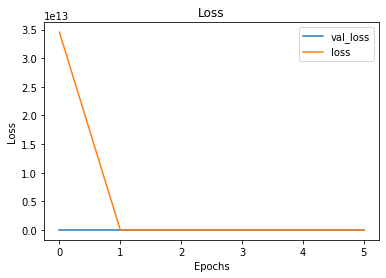

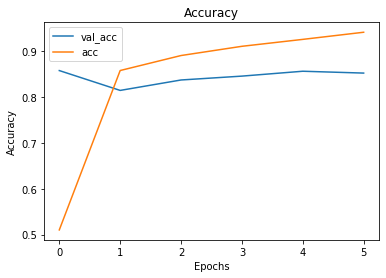

 
                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.90      0.95      0.92      1872
           1       0.69      0.52      0.59       402

    accuracy                           0.87      2274
   macro avg       0.79      0.73      0.76      2274
weighted avg       0.86      0.87      0.87      2274

 
                 Confusion Matrix
-------------------------------------------------------


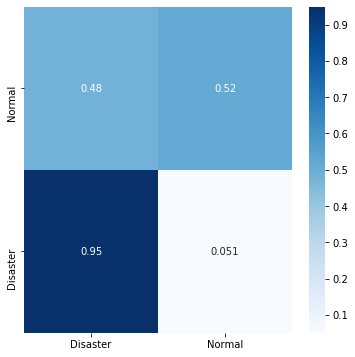

In [97]:
# Early Stopping 
callback = EarlyStopping(monitor = 'val_acc', patience = 5, mode = 'max', 
                         min_delta = .01, restore_best_weights = True)

# Create a base neural network
model5 = Sequential()

# Embedding layer
model5.add(Embedding(input_dim = len(word_index) + 1, 
                           input_length = max_length, 
                           output_dim = 3000)) # changed this from 100, raise it more
model5.add(SpatialDropout1D(0.3))


model5.add(Bidirectional(LSTM(activation = 'relu', units = 64, dropout = 0.3, 
                             recurrent_dropout = 0.3, kernel_regularizer = regularizers.l2(.1))))

model5.add(Dropout(0.3))


model5.add(Dense(128, activation = 'relu'))
model5.add(Dropout(0.3))

model5.add(Dense(64, activation = 'relu'))
model5.add(Dropout(0.3))

model5.add(LeakyReLU(alpha = 0.3))
model5.add(Dropout(0.3))

# Output layer
model5.add(Dense(1, activation = 'sigmoid'))

# Compile
model5.compile(optimizer = 'RMSProp', loss = 'binary_crossentropy', metrics = ['acc'])

# Fit 
history5 = model5.fit(train_padded, y_train_2, batch_size = 128,
                      epochs = 50, validation_split = 0.3, callbacks = callback, 
                      class_weight = weights)

# Evaluate
evaluate_network(history5, model5, test_padded, y_test_2)

#91/68 with 128/64 & leaky relu with batch size 128, unites in LSTM 64

### New GRU - 12/23

Epoch 1/50
100/100 [==============================] - 260s 3s/step - loss: 7.0062 - acc: 0.4896 - val_loss: 0.7404 - val_acc: 0.6292
Epoch 2/50
100/100 [==============================] - 263s 3s/step - loss: 0.6493 - acc: 0.7798 - val_loss: 0.7425 - val_acc: 0.7204
Epoch 3/50
100/100 [==============================] - 310s 3s/step - loss: 0.4896 - acc: 0.8839 - val_loss: 0.5747 - val_acc: 0.8303
Epoch 4/50
100/100 [==============================] - 314s 3s/step - loss: 0.8226 - acc: 0.9083 - val_loss: 0.5712 - val_acc: 0.8600
Epoch 5/50
100/100 [==============================] - 336s 3s/step - loss: 0.3885 - acc: 0.9337 - val_loss: 0.5576 - val_acc: 0.8600
Epoch 6/50
100/100 [==============================] - 326s 3s/step - loss: 0.3556 - acc: 0.9394 - val_loss: 0.6843 - val_acc: 0.8259
Epoch 7/50
100/100 [==============================] - 321s 3s/step - loss: 5614821.5000 - acc: 0.9461 - val_loss: 1.0684 - val_acc: 0.8402
Epoch 8/50
100/100 [==============================] - 297s 3s/s

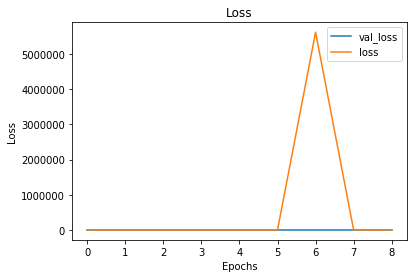

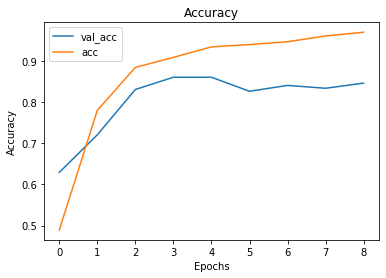

 
                 Classification Report
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.92      0.93      0.93      1872
           1       0.67      0.62      0.65       402

    accuracy                           0.88      2274
   macro avg       0.80      0.78      0.79      2274
weighted avg       0.88      0.88      0.88      2274

 
                 Confusion Matrix
-------------------------------------------------------


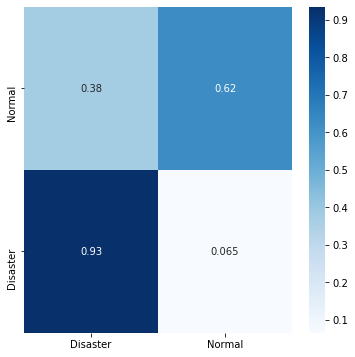

In [98]:
from tensorflow.keras.layers import GRU

# Early Stopping 
callback = EarlyStopping(monitor = 'val_acc', patience = 5, mode = 'max', 
                         min_delta = .01, restore_best_weights = True)

# Create a base neural network
model6 = Sequential()

# Embedding layer
model6.add(Embedding(input_dim = len(word_index) + 1, 
                           input_length = max_length, 
                           output_dim = 2500)) # changed this from 100, raise it more
model6.add(SpatialDropout1D(0.3))


# Hidden layers
model6.add(Bidirectional(GRU(activation = 'relu', units = 64, dropout = 0.3, 
                             recurrent_dropout = 0.3, kernel_regularizer = regularizers.l2(.1))))

model6.add(Dropout(0.3))


model6.add(Dense(64, activation = 'relu'))
model6.add(Dropout(0.3))

model6.add(Dense(32, activation = 'relu'))
model6.add(Dropout(0.3))


# Output layer
model6.add(Dense(1, activation = 'sigmoid'))

# Compile
model6.compile(optimizer = 'RMSProp', loss = 'binary_crossentropy', metrics = ['acc'])

# Fit 
history6 = model6.fit(train_padded, y_train_2, batch_size = 64,
                      epochs = 50, validation_split = 0.3, callbacks = callback, 
                      class_weight = weights)

# Evaluate
evaluate_network(history6, model6, test_padded, y_test_2)

## Interpret

### Interpretations from Classifiers

#### Feature Importances

In [99]:
logreg.coef_

array([[ 0.12794949, -0.04185109, -0.04306415, ..., -0.10231402,
        -0.05854621, -0.05197849]])

In [100]:
vectorizer.get_feature_names()

['#039',
 '#100asianheartthrobs2020',
 '#1037thebeat',
 '#10552-c',
 '#10tv',
 '#127liveslost',
 '#1495days',
 '#1496days',
 '#152',
 '#19yearsofdheena',
 '#20plenty',
 '#20yearsofhrithikroshan',
 '#365daysofbiking',
 '#3f6a2d',
 '#49ers',
 '#4daystotitanscollections',
 '#5daystotitanscollections',
 '#5g',
 '#7news',
 '#911lonestar',
 '#962',
 '#a1',
 '#a12',
 '#a141',
 '#a303',
 '#a5339426',
 '#a92',
 '#abc730',
 '#ablanari',
 '#abor',
 '#aborbitadi',
 '#aboriginal',
 '#acce',
 '#account',
 '#actionad',
 '#actors',
 '#adoreyou',
 '#ados',
 '#advocate',
 '#afghanistan',
 '#africakwetu',
 '#afroseries',
 '#aftershock',
 '#aftodioikisi',
 '#afzalguru',
 '#agbarr',
 '#agchat',
 '#agnation',
 '#ahorasuena',
 '#airline',
 '#airquality',
 '#ajaydevgan',
 '#ajk',
 '#alabtopspotonmyx',
 '#alaska',
 '#alavaikunthapurramloo',
 '#aldubxadnbayanihantayo',
 '#alert',
 '#alertwr',
 '#alfdubs',
 '#algw',
 '#allah_is_kabir',
 '#allatsea',
 '#allsaintspassage',
 '#alshabaab',
 '#alshamrani-now',
 '#alt

In [101]:
# Get the feature importances from the Logistic Regression model

# features_dict = {'Features': vectorizer.get_feature_names(),
#                  'Importance': logreg.coef_}

# feature_importances = pd.DataFrame(features_dict, columns = ['Features', 'Importance'])

# print(features_importances.shape)
# feature_importances

#### SHAP

In [102]:
# Creating shap values and a shap explainer
import shap

X_shap = shap.sample(X_test_processed, 250)
explainer = shap.LinearExplainer(logreg, X_shap, feature_dependence="independent")
shap_values = explainer.shap_values(X_shap)

The option feature_dependence has been renamed to feature_perturbation!
The option feature_perturbation="independent" is has been renamed to feature_perturbation="interventional"!


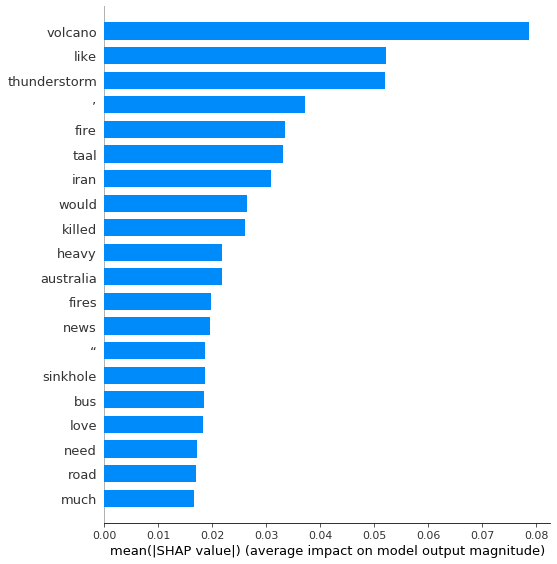

In [103]:
# Plotting a shap summary barplot

shap.summary_plot(shap_values, X_shap, plot_type = 'bar', feature_names = vectorizer.get_feature_names())

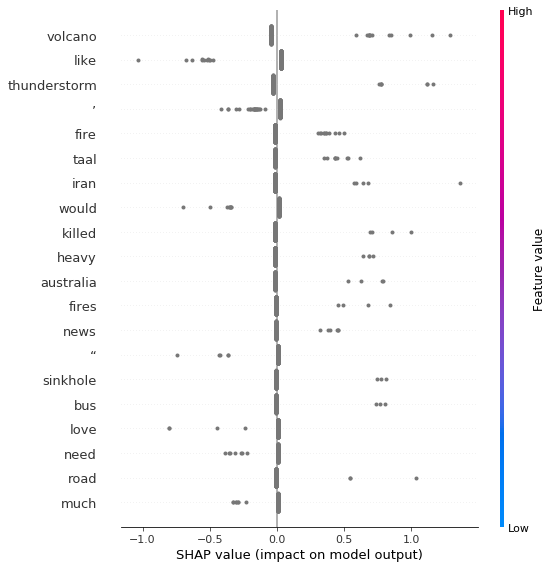

In [104]:
# Plotting a shap summary importance plot

shap.summary_plot(shap_values, X_test_processed, feature_names = vectorizer.get_feature_names())

### Interpretations from Neural Networks

 <div class="alert alert-info" role="alert">
Interpeting neural networks with Lime proved to be extremely difficult.  I was able to get a solid walkthrough of how to do this from  <a href="https://www.youtube.com/watch?v=lTgB8lf5Zcothis">from this youtube video.</a>
</div>

In [105]:
# Using Lime to attempt to explain the output of our neural networks

import lime
from lime.lime_text import LimeTextExplainer

explainer = LimeTextExplainer(class_names = ['non-disaster', 'disaster'])

In [106]:
# In order to do this, we must create a new function to make predictions that Lime will play ball with

def new_predict(texts):
    '''Gets new predictions that are compatible with Lime'''
    _seq = tokenizer.texts_to_sequences(texts)
    _text_data = pad_sequences(_seq, maxlen = max_length, padding = 'post', truncating = 'post')
    
    return np.array([[float(1 - x), float(x)] for x in model4.predict(_text_data)])

In [107]:
# Testing a sentence

X_test_2.iloc[-1]

'hong kong police terrorism 2020'

In [108]:
# Testing a padded sequence

test_padded[-1]

array([1946, 2127,   60,  769,   69,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0], dtype=int32)

In [109]:
# Testing the prediction function

model4.predict(test_padded[-1].reshape(1, -1))

array([[0.3808898]], dtype=float32)

In [110]:
# Using a Lime Explainer with a random entry

exp = explainer.explain_instance(X_test_2.iloc[0], new_predict, num_features = max_length, top_labels = 0)
exp.show_in_notebook(text = False)

split() requires a non-empty pattern match.


In [111]:
# Using a Lime Explainer with a random entry

exp = explainer.explain_instance(X_test_2.iloc[1], new_predict, num_features = max_length, top_labels = 1)
exp.show_in_notebook(text = False)

split() requires a non-empty pattern match.


In [112]:
exp = explainer.explain_instance(X_test_2.iloc[24], new_predict, num_features = max_length, top_labels = 24)
exp.show_in_notebook(text = False)

split() requires a non-empty pattern match.


In [113]:
exp = explainer.explain_instance(X_test_2.iloc[8], new_predict, num_features = max_length, top_labels = 8)
exp.show_in_notebook(text = False)

split() requires a non-empty pattern match.


In [114]:
exp = explainer.explain_instance(X_test_2.iloc[98], new_predict, num_features = max_length, top_labels = 98)
exp.show_in_notebook(text = False)

split() requires a non-empty pattern match.


## Conclusion

Social media outlets are increasingly becoming a primary outlet for breaking news and the ability to be able to determine whether a post is newsworthy or nonsense is vital to creating awareness of events and if needed, increase the response time for an emergency.  Throughout this notebook, we attempted to create machine learning models that could accurately predict whether or not a tweet was in reference to a disaster.  This model could be deployed as a social media monitor that can take in a series of twweets and determine if it is a "disaster tweet" or just a run of the mill post.  For example, the difference between "The plane crashed." and "We crashed the party.  

### Results

Throughout this notebook, we experimented with using both supervised machine learning methods as well as deep learning methods in order to try to produce the most accurate model possible. 
 <div class="alert alert-info" role="alert">
<b><u>With the conclusion of this experiment, we have achieved the following results:</b></u>
 - <b>Phrases are more significant than single words:</b> When comparing bigrams to common words, the bigrams were much more telling of whether or not a sentence would be in reference to a disaster.<br><br>
 
 - <b>Complexity isn't always better:</b> In this experiment, a simple Logistic Regression model outpeformed highly complex neural networks, and did so in a fraction of the time.<br><br>
 
 - <b> "Disaster" Keywords have the highest feature importance:</b> Words appearing in the top 20 most important include volcano, thunderstorm, fire, fires, killed, sinkhole, etc.
 
 </div>

### Recommendations 

<b>Based on this analysis, we can make the following recommendations:</b>
 <div class="alert alert-info" role="alert">
- For basic NLP, focus on short phrases that include a "Disaster" Keyword
- In terms of modeling, use a Logistic Regression model.
- Create a supervised machine learning model that focuses on learning short phrases as opposed to single words.
    </div>

### Future Work

<b>With more time, we can improve on this model in the following ways:</b>
 <div class="alert alert-info" role="alert">
- <b>Scrape Additional Data:</b> With more data, we can increase the accuracy of the neural networks.   
- <b>Try Additional Types of Models:</b> There are several different other types of models that we can potentially try and see if we can increase the accuracy of our results. 
- <b>Fine Tuning:</b> We can spend more time tuning our existing models in order to achieve the absolute best results.
   </div>

<center><b><i> Thank you. </i></b></center>